In [14]:
import matplotlib.pyplot as plt
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm
torch.manual_seed(0)  # Set for testing purposes, please do not change!


In [15]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
n_samples = batch_size
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("Using CUDA device:", torch.cuda.get_device_name(device))
else:
    device = torch.device("cpu")
    print("Using CPU device.")

Using CPU device.


In [16]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()


dataloader = DataLoader(
    MNIST(".", download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True,
)

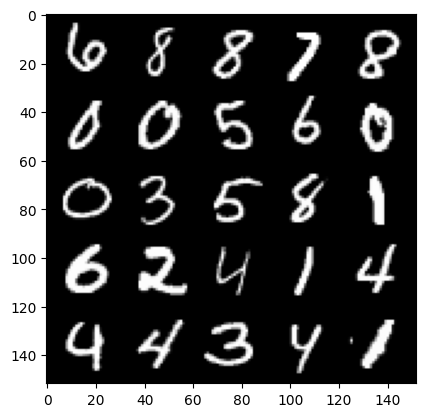

In [17]:
for data in dataloader:
    image, label = data
    break
show_tensor_images(image)


In [18]:
def get_generator_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
    )
def get_discriminator_block(input_dim, output_dim):
    return nn.Sequential(
         nn.Linear(input_dim, output_dim), #Layer 1
         nn.LeakyReLU(0.2, inplace=True)
    )
class Generator(nn.Module):

    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )
    def forward(self, noise):
        return self.gen(noise)
    
    def get_gen(self):
        return self.gen
class Discriminator(nn.Module):

    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        return self.disc(image)
    
    def get_disc(self):
        return self.disc

  6%|▌         | 29/469 [00:00<00:13, 31.69it/s]

Step 500: Generator loss: 1.4159101158380516, discriminator loss: 0.8512399752140056


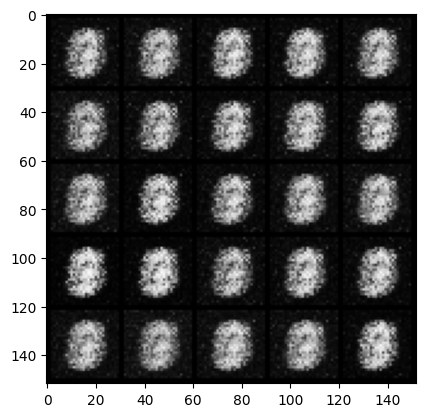

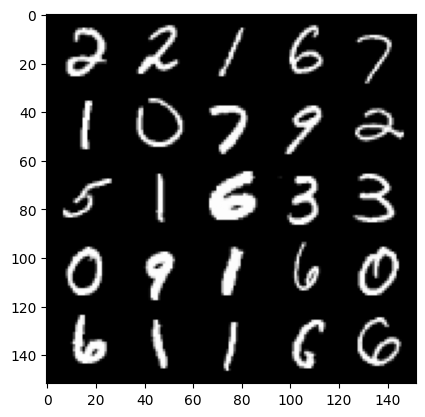

 13%|█▎        | 61/469 [00:01<00:10, 38.05it/s]

Step 1000: Generator loss: 1.760953252792358, discriminator loss: 0.5521289106607434


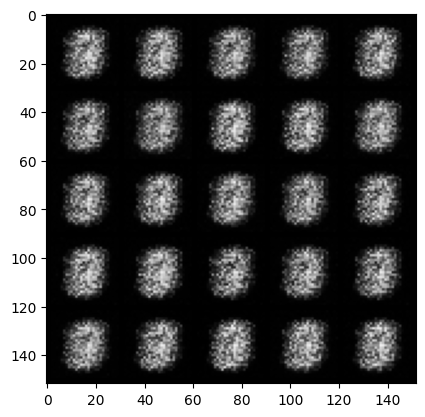

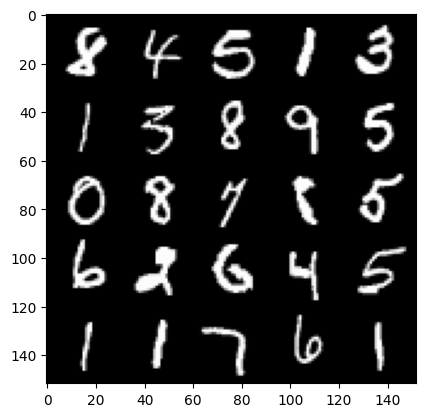

 19%|█▉        | 91/469 [00:02<00:09, 39.17it/s]

Step 1500: Generator loss: 2.0197248613834393, discriminator loss: 0.33094672536849945


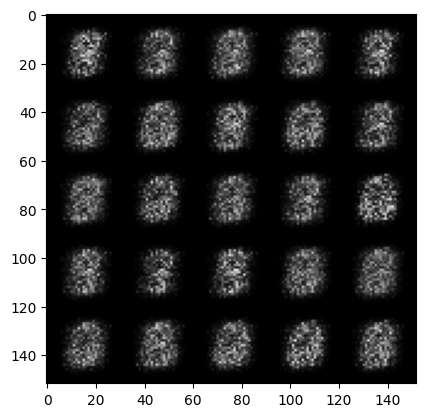

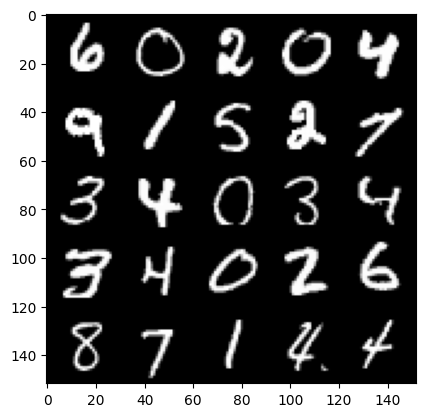

 26%|██▋       | 124/469 [00:03<00:08, 38.34it/s]

Step 2000: Generator loss: 1.674387700796127, discriminator loss: 0.44224440097808815


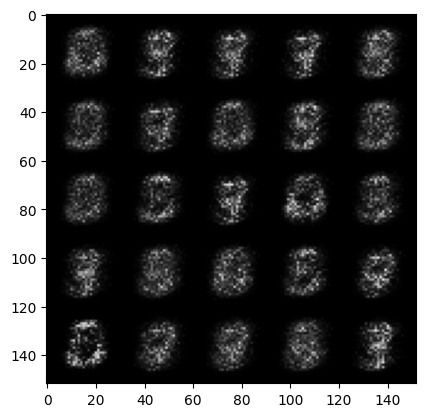

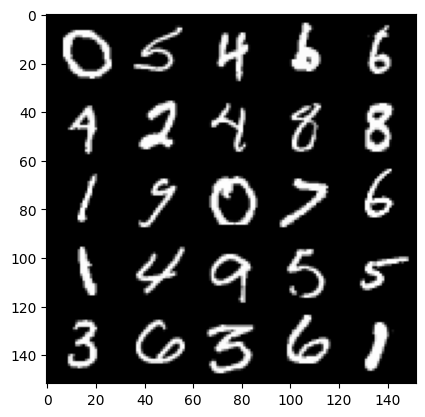

 33%|███▎      | 154/469 [00:03<00:07, 41.84it/s]

Step 2500: Generator loss: 1.6478199903964996, discriminator loss: 0.411101541399956


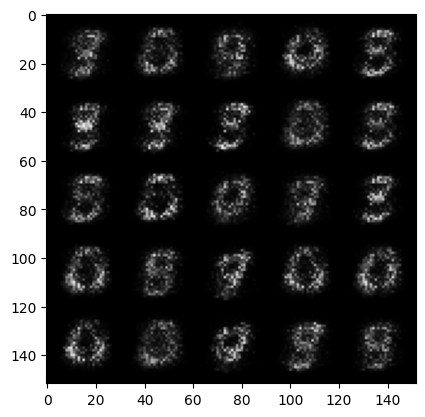

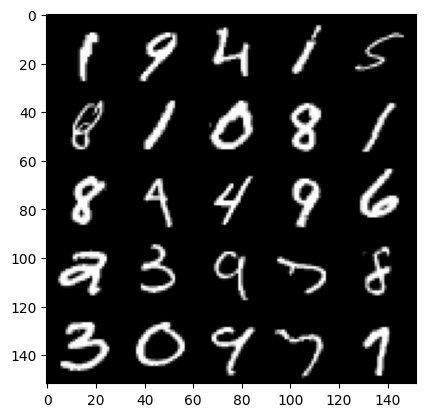

 39%|███▉      | 183/469 [00:04<00:07, 38.17it/s]

Step 3000: Generator loss: 1.928932344436648, discriminator loss: 0.3266455207169057


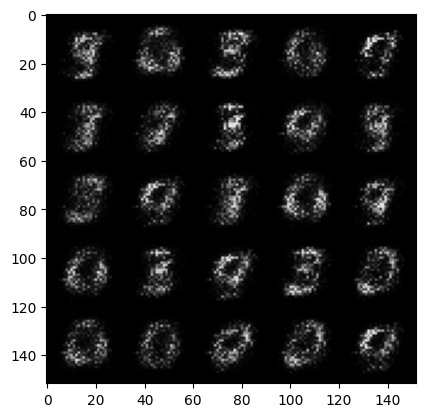

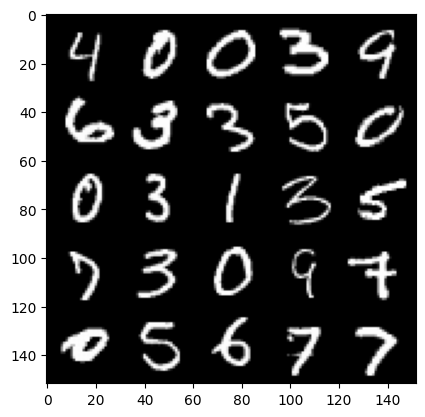

 46%|████▌     | 216/469 [00:05<00:06, 36.61it/s]

Step 3500: Generator loss: 2.3000186502933495, discriminator loss: 0.29166330268979085


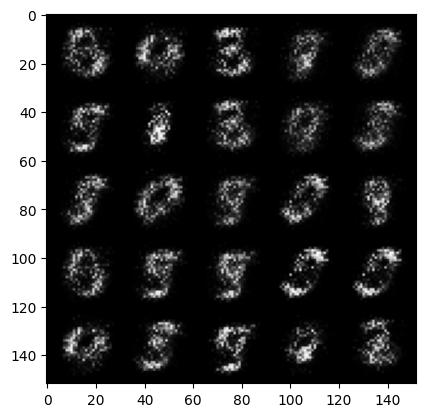

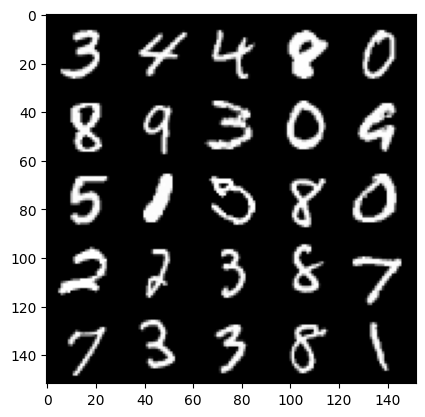

 52%|█████▏    | 245/469 [00:06<00:05, 37.92it/s]

Step 4000: Generator loss: 2.6195360827445997, discriminator loss: 0.26049468147754673


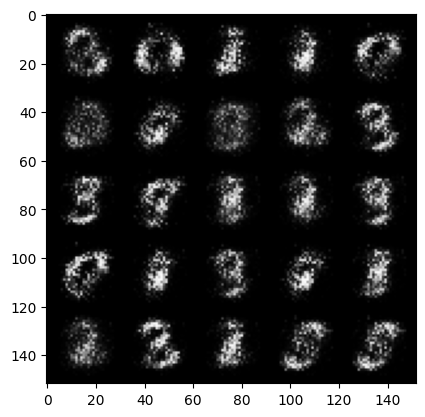

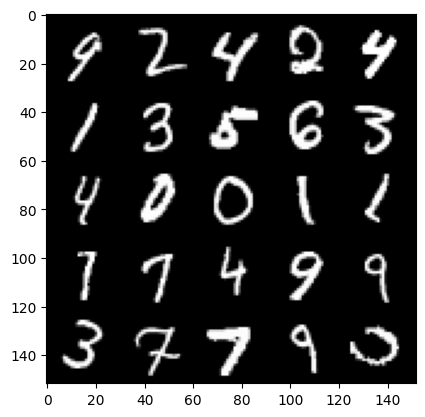

 59%|█████▉    | 276/469 [00:07<00:05, 36.73it/s]

Step 4500: Generator loss: 2.9795800795555096, discriminator loss: 0.20647922483086584


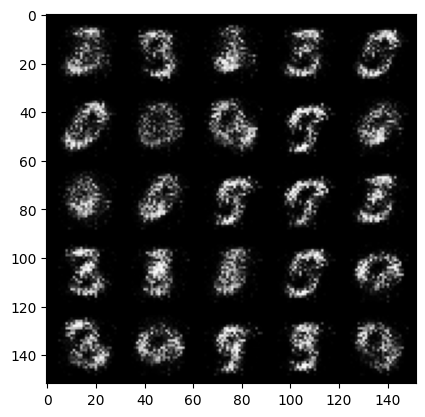

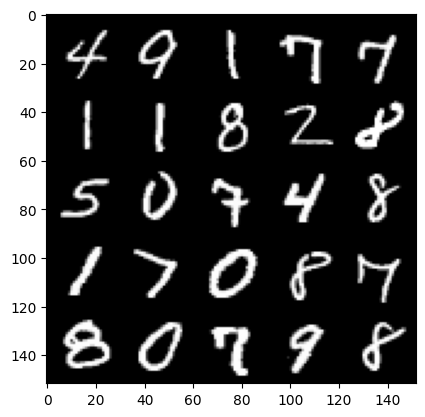

 66%|██████▌   | 310/469 [00:08<00:04, 37.86it/s]

Step 5000: Generator loss: 3.3607665410041787, discriminator loss: 0.15081472122669215


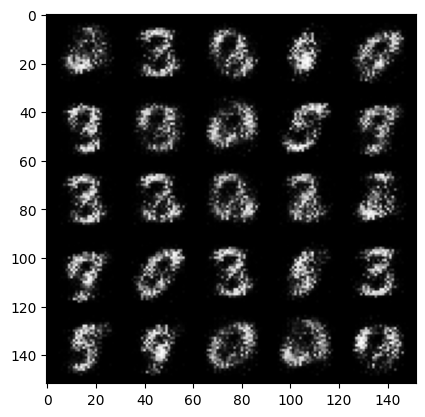

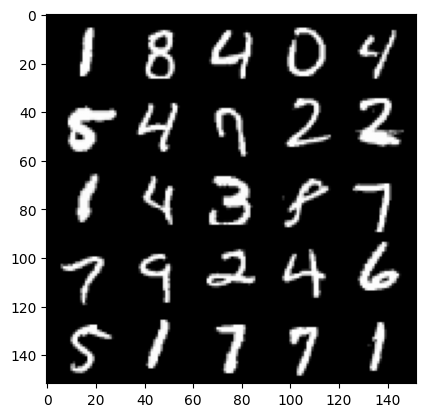

 72%|███████▏  | 340/469 [00:09<00:03, 37.82it/s]

Step 5500: Generator loss: 3.6634774637222294, discriminator loss: 0.1285212598145008


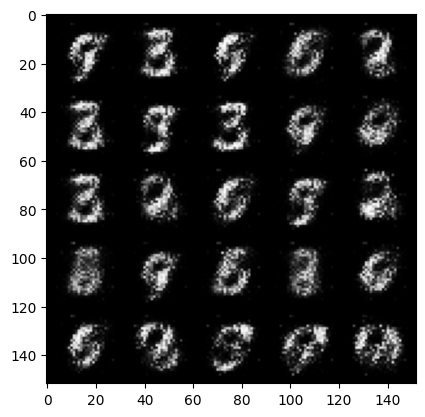

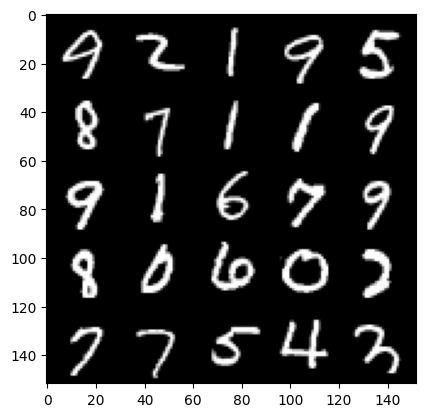

 79%|███████▉  | 372/469 [00:10<00:02, 39.17it/s]

Step 6000: Generator loss: 3.8179842195510845, discriminator loss: 0.1268524291217327


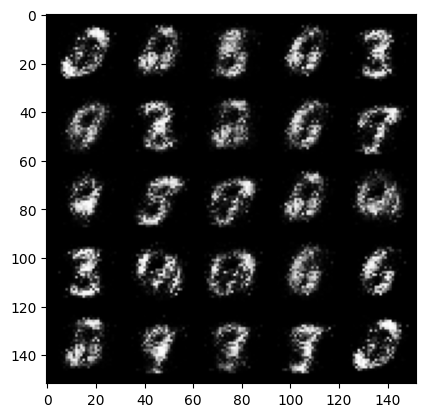

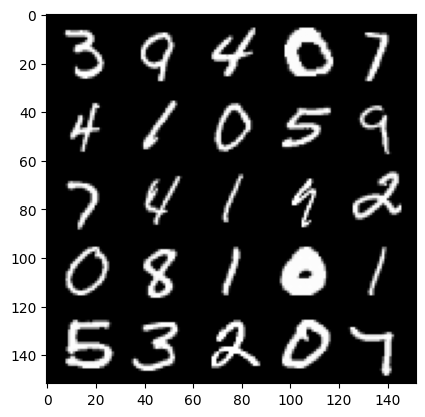

 86%|████████▌ | 403/469 [00:10<00:01, 39.52it/s]

Step 6500: Generator loss: 3.9289038710594197, discriminator loss: 0.11857800431549549


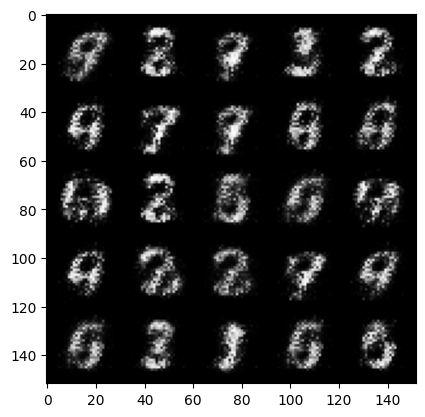

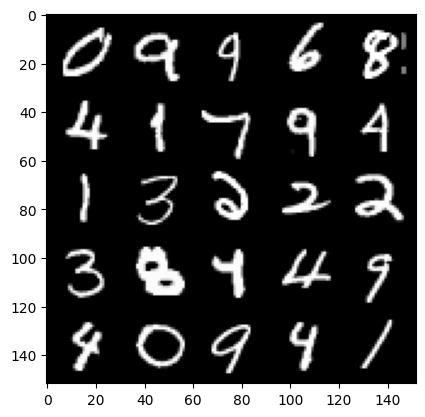

 92%|█████████▏| 432/469 [00:11<00:01, 34.50it/s]

Step 7000: Generator loss: 4.12598448181152, discriminator loss: 0.10607121759653078


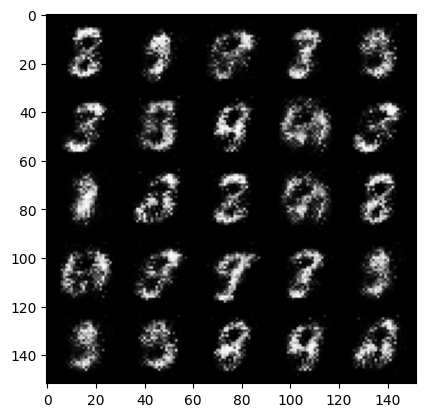

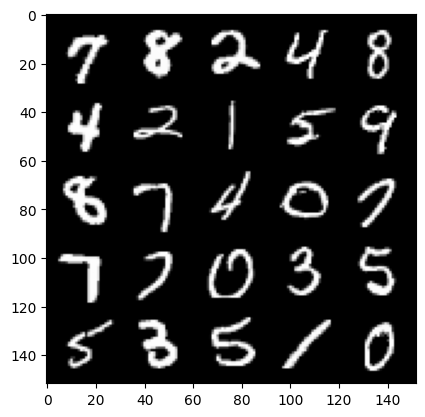

 99%|█████████▊| 462/469 [00:12<00:00, 34.09it/s]

Step 7500: Generator loss: 4.139766779422759, discriminator loss: 0.10160358546674261


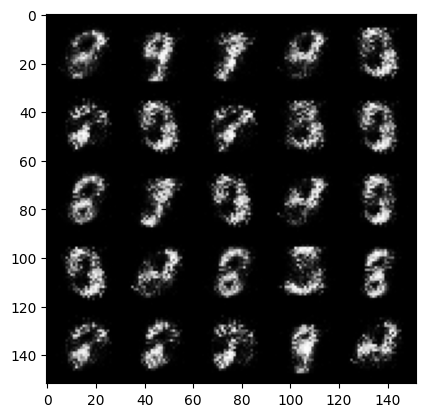

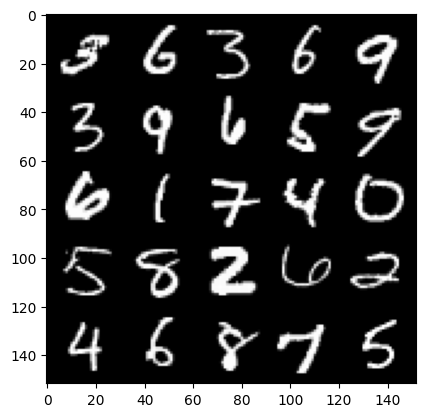

  6%|▌         | 27/469 [00:00<00:13, 32.16it/s]

Step 8000: Generator loss: 4.110179394245147, discriminator loss: 0.10857306627184139


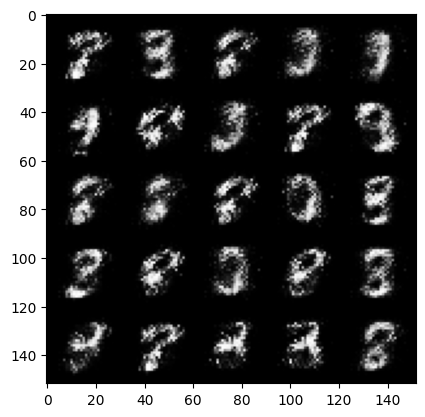

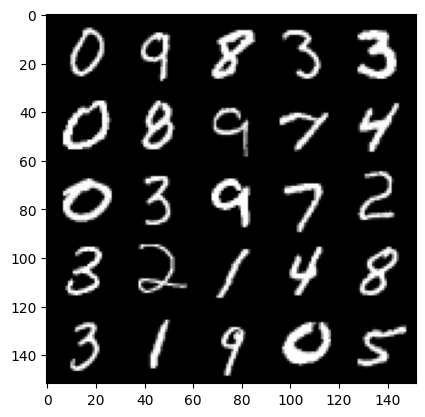

 12%|█▏        | 55/469 [00:01<00:10, 37.74it/s]

Step 8500: Generator loss: 3.9732322468757646, discriminator loss: 0.11870248013734816


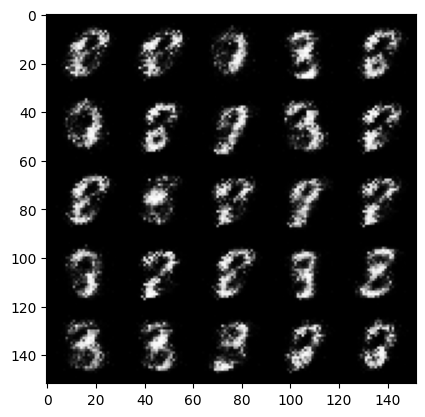

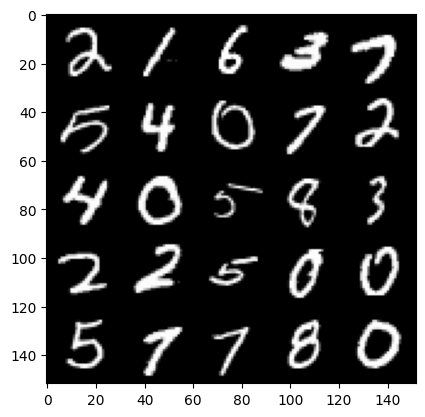

 19%|█▉        | 89/469 [00:02<00:10, 36.30it/s]

Step 9000: Generator loss: 4.095347159862517, discriminator loss: 0.1190725987404584


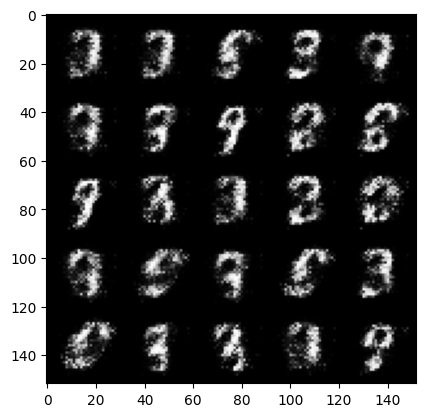

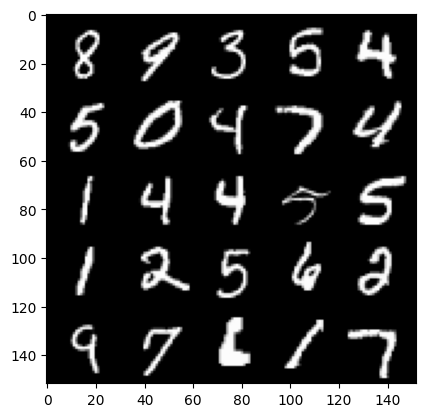

 25%|██▌       | 118/469 [00:03<00:08, 39.38it/s]

Step 9500: Generator loss: 4.253672013282769, discriminator loss: 0.11429535688459877


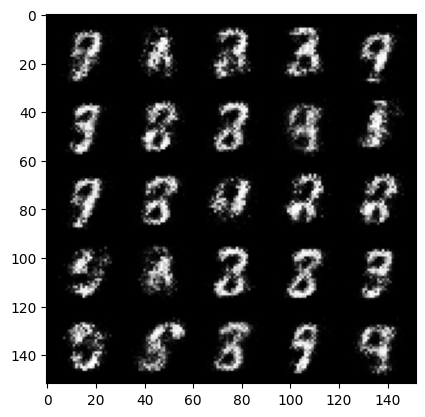

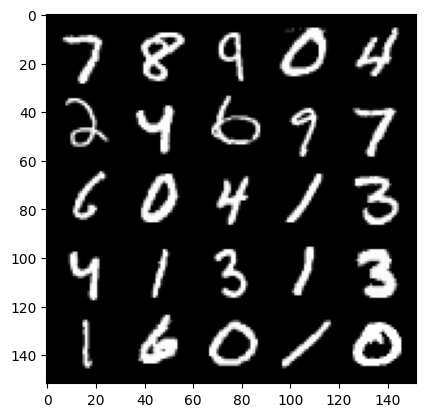

 32%|███▏      | 151/469 [00:04<00:07, 40.31it/s]

Step 10000: Generator loss: 4.020890063762665, discriminator loss: 0.14086896282434463


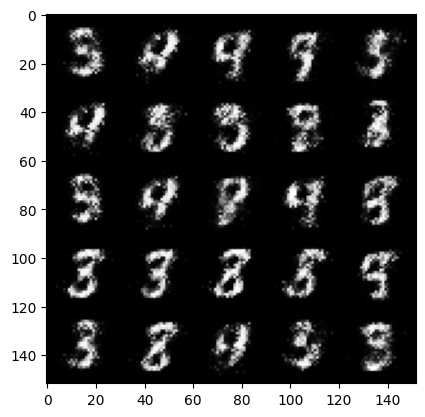

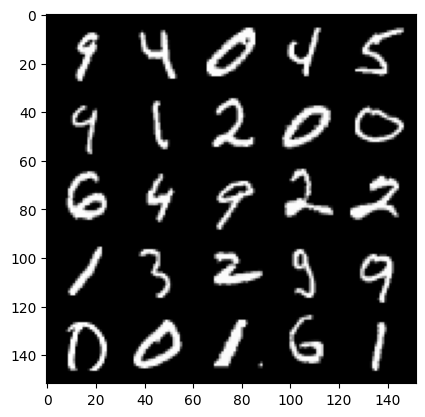

 38%|███▊      | 178/469 [00:04<00:07, 41.04it/s]

Step 10500: Generator loss: 3.9273393898010256, discriminator loss: 0.1409796357601881


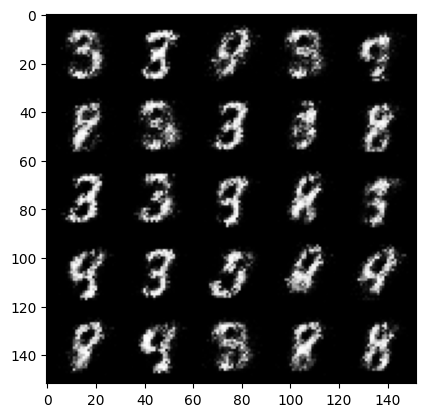

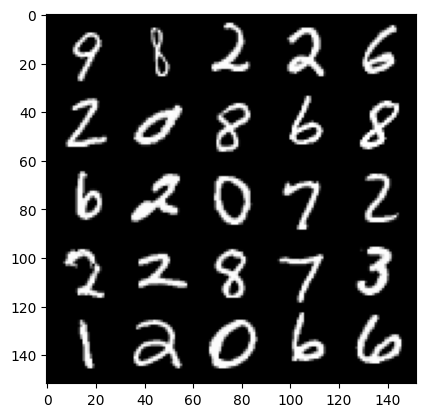

 45%|████▍     | 210/469 [00:05<00:06, 42.98it/s]

Step 11000: Generator loss: 3.939258558750153, discriminator loss: 0.1548755759745836


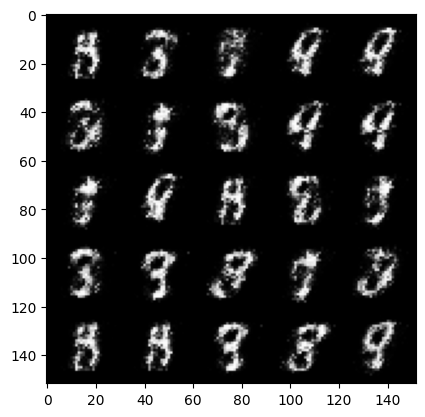

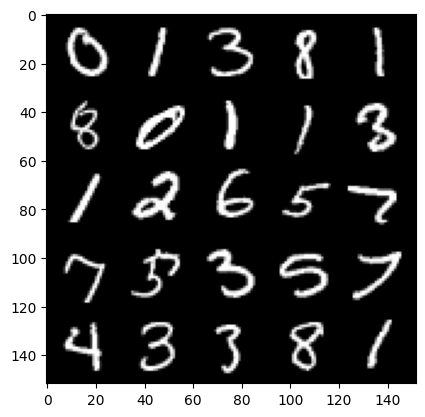

 51%|█████     | 240/469 [00:06<00:05, 39.10it/s]

Step 11500: Generator loss: 4.058687369346617, discriminator loss: 0.15953898791968824


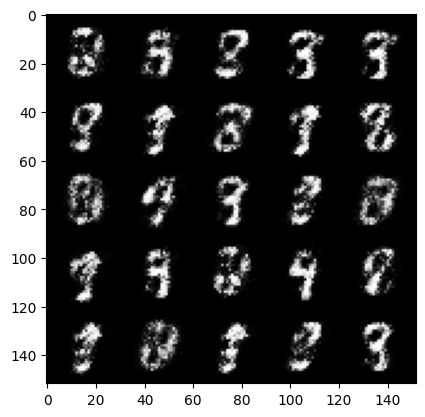

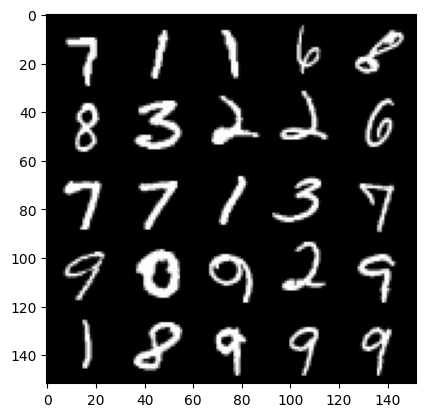

 58%|█████▊    | 274/469 [00:06<00:04, 40.73it/s]

Step 12000: Generator loss: 4.020240513324736, discriminator loss: 0.14977439296245568


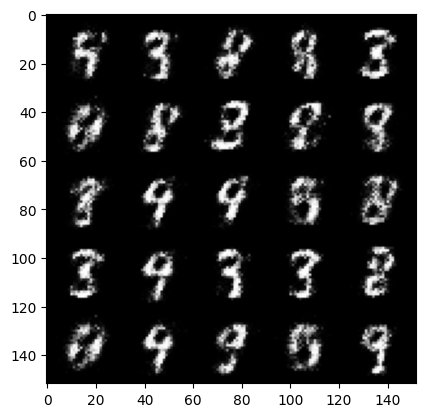

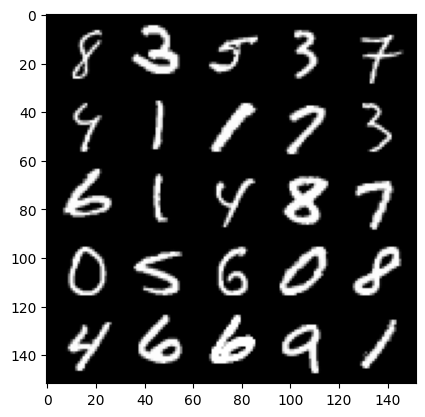

 64%|██████▍   | 302/469 [00:07<00:04, 41.74it/s]

Step 12500: Generator loss: 3.8935145769119246, discriminator loss: 0.1599165487587451


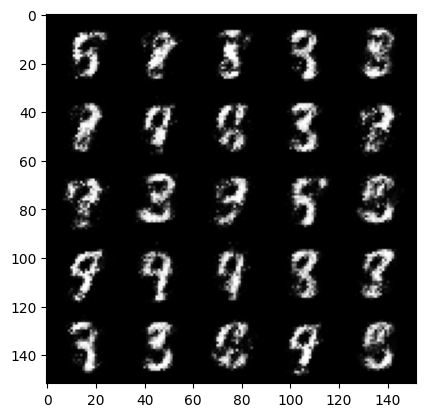

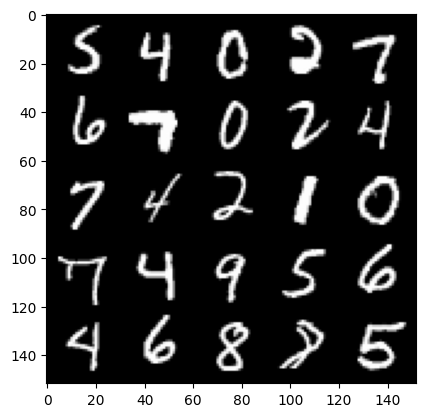

 71%|███████   | 334/469 [00:08<00:03, 40.11it/s]

Step 13000: Generator loss: 3.891668653488159, discriminator loss: 0.15458343626558774


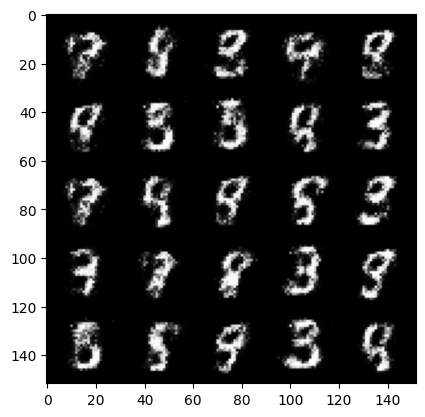

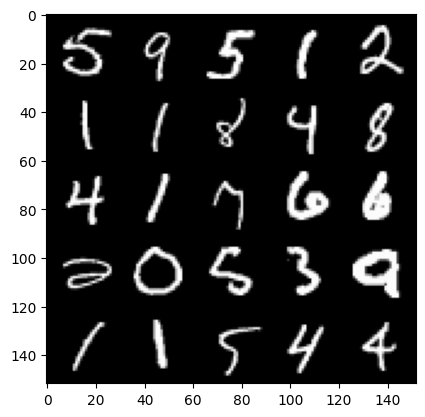

 78%|███████▊  | 368/469 [00:08<00:02, 42.36it/s]

Step 13500: Generator loss: 3.945251364707948, discriminator loss: 0.15815412288904188


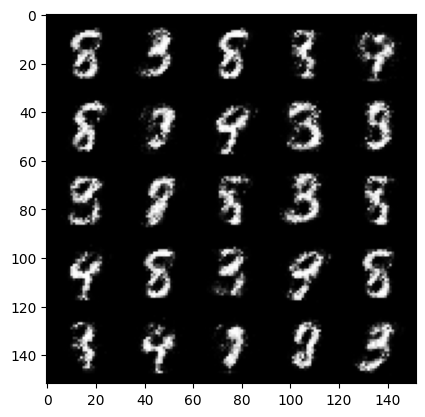

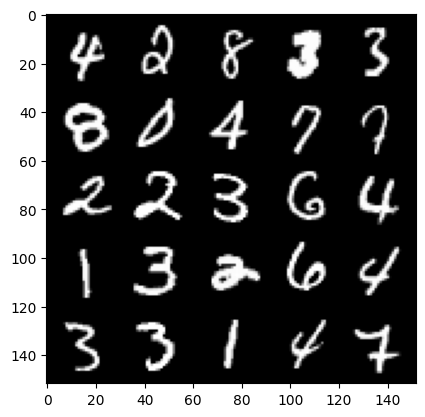

 84%|████████▍ | 395/469 [00:10<00:01, 40.16it/s]

Step 14000: Generator loss: 3.9093542962074253, discriminator loss: 0.1745915680378676


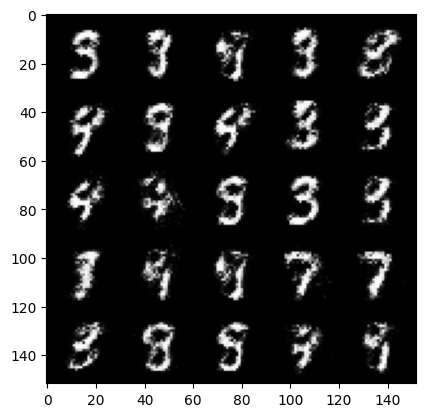

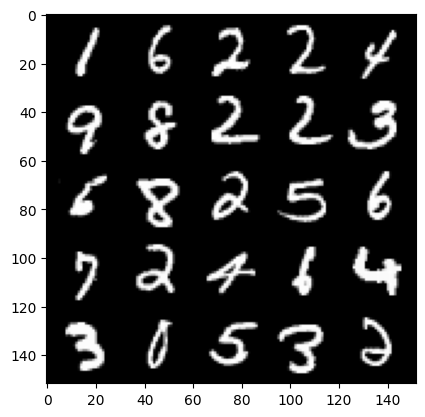

 91%|█████████▏| 429/469 [00:10<00:00, 40.06it/s]

Step 14500: Generator loss: 3.849907691001894, discriminator loss: 0.17400923183560357


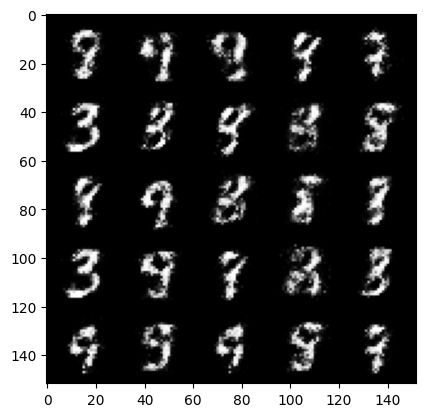

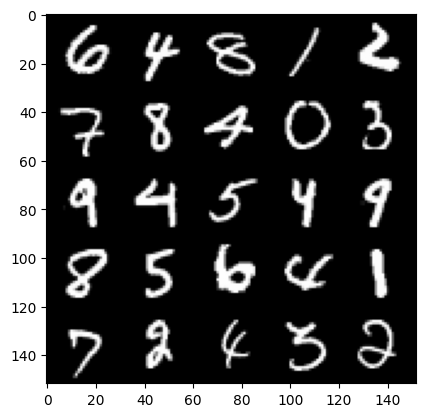

 98%|█████████▊| 459/469 [00:13<00:00, 31.19it/s]

Step 15000: Generator loss: 3.9027557711601246, discriminator loss: 0.21498063552379593


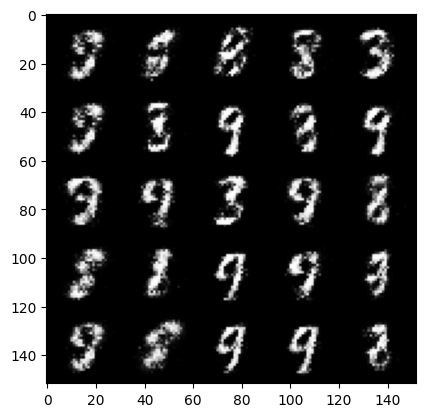

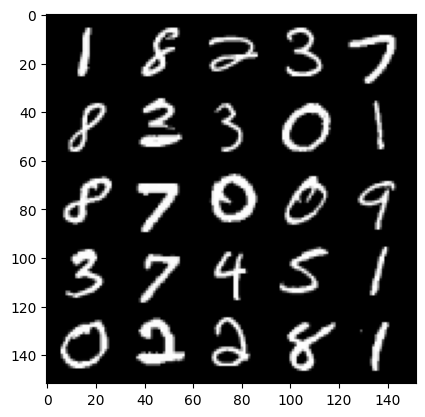

  4%|▍         | 20/469 [00:00<00:13, 34.24it/s]

Step 15500: Generator loss: 4.011912918567657, discriminator loss: 0.18103471124172224


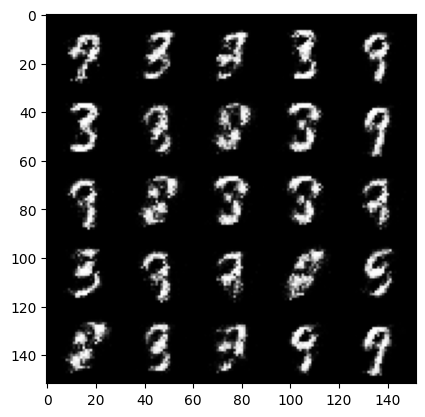

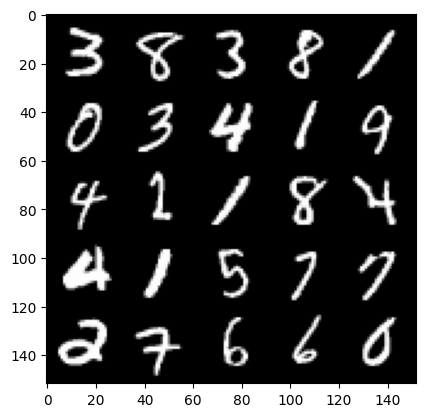

 11%|█         | 52/469 [00:01<00:12, 34.00it/s]

Step 16000: Generator loss: 3.8333051648139946, discriminator loss: 0.20497964498400678


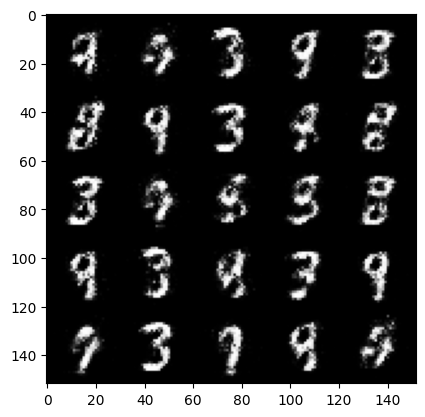

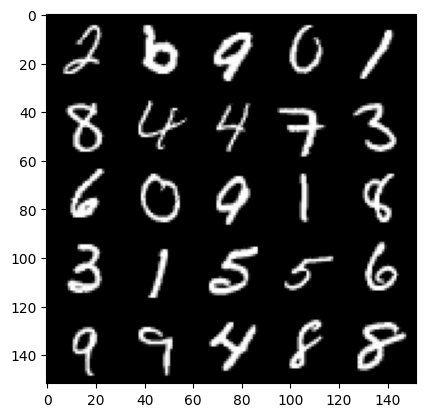

 18%|█▊        | 84/469 [00:02<00:10, 35.16it/s]

Step 16500: Generator loss: 3.6431235442161567, discriminator loss: 0.24015026509761825


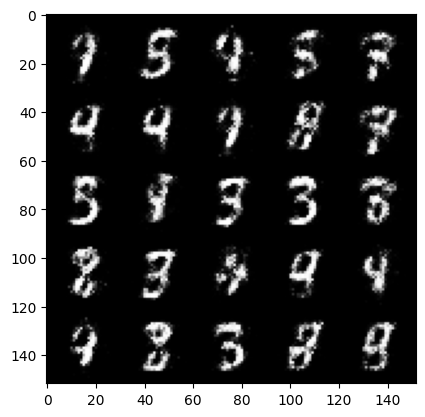

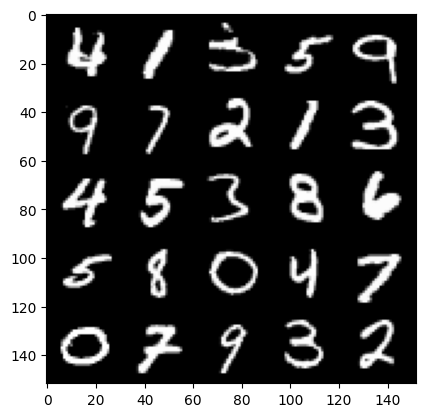

 25%|██▍       | 116/469 [00:03<00:10, 35.09it/s]

Step 17000: Generator loss: 3.7622095646858233, discriminator loss: 0.2339203763008118


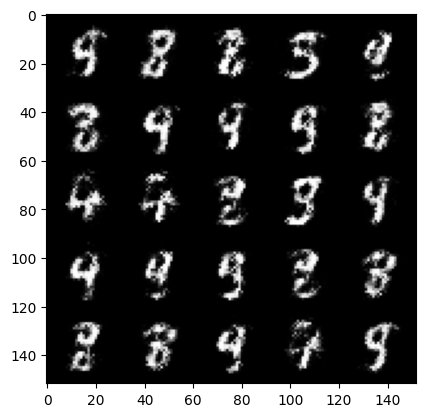

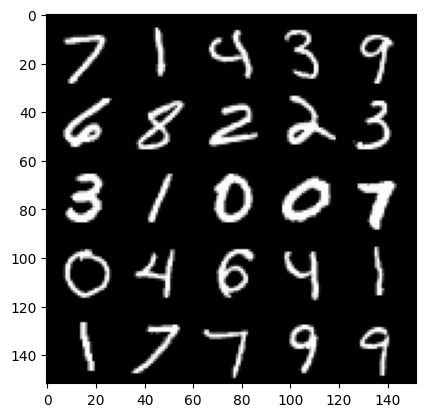

 31%|███       | 146/469 [00:04<00:10, 31.12it/s]

Step 17500: Generator loss: 3.8907493691444404, discriminator loss: 0.20297082853317244


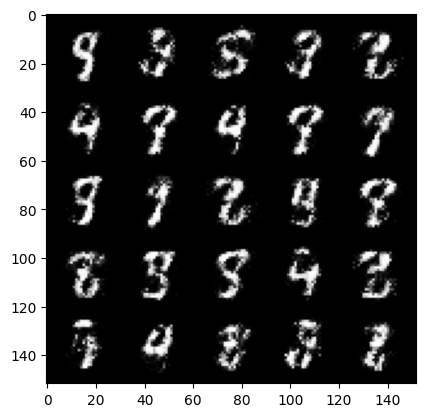

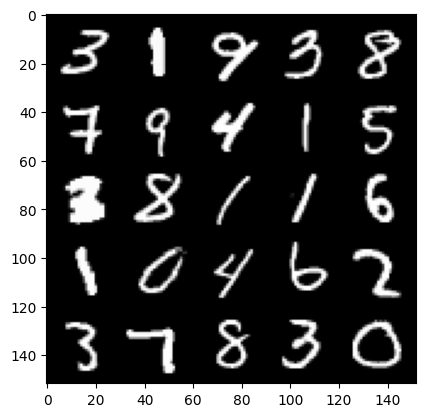

 38%|███▊      | 176/469 [00:05<00:08, 33.18it/s]

Step 18000: Generator loss: 3.6533150706291155, discriminator loss: 0.2533846464455128


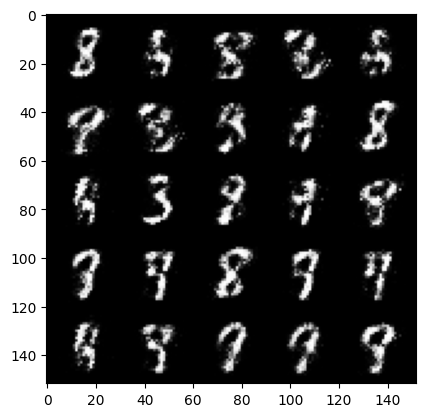

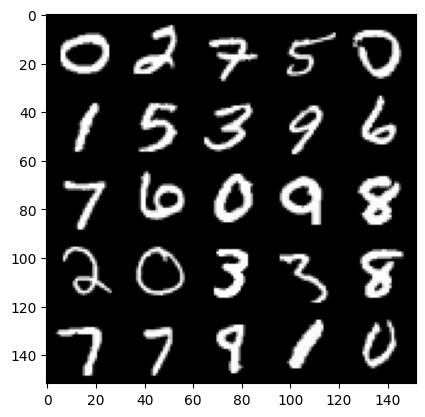

 44%|████▍     | 208/469 [00:06<00:07, 32.90it/s]

Step 18500: Generator loss: 3.3966148667335525, discriminator loss: 0.26376636396348485


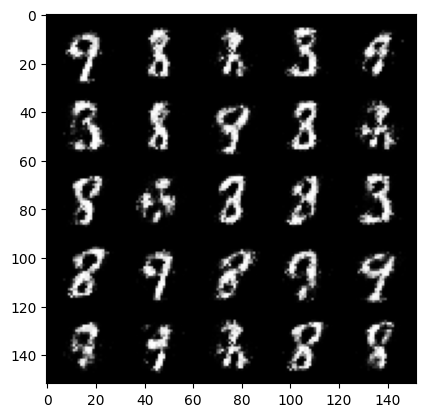

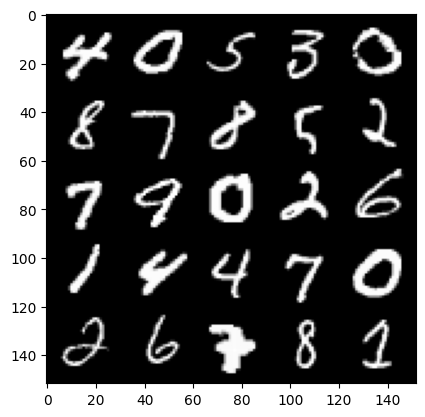

 51%|█████     | 239/469 [00:07<00:07, 32.81it/s]

Step 19000: Generator loss: 3.5059015836715735, discriminator loss: 0.23996305620670302


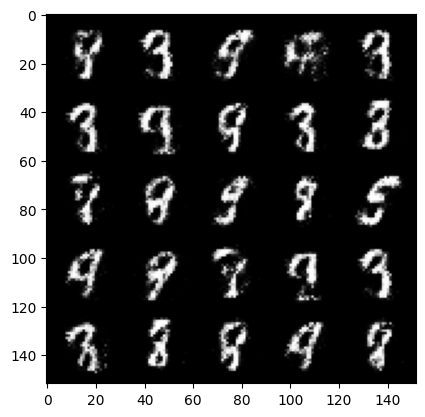

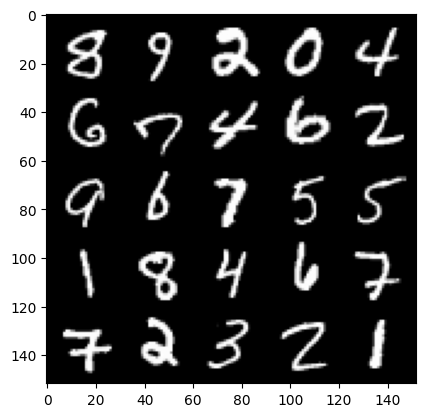

 57%|█████▋    | 269/469 [00:08<00:06, 29.59it/s]

Step 19500: Generator loss: 3.2377945485115043, discriminator loss: 0.32923087978363025


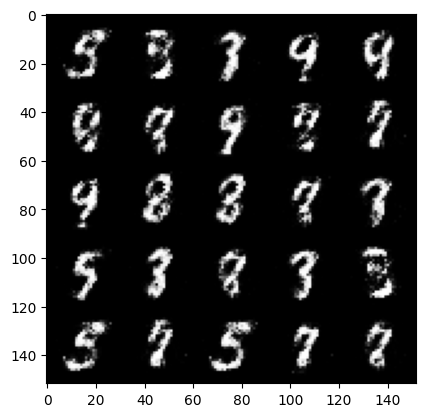

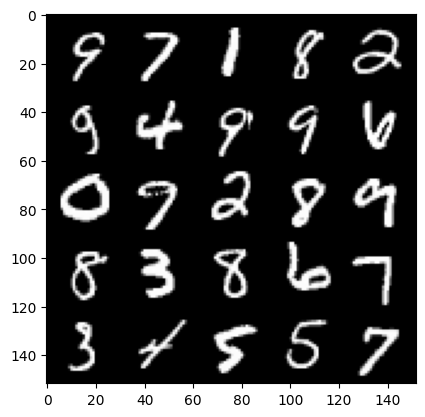

 64%|██████▍   | 300/469 [00:10<00:05, 30.33it/s]

Step 20000: Generator loss: 3.228415504455567, discriminator loss: 0.3071610431075094


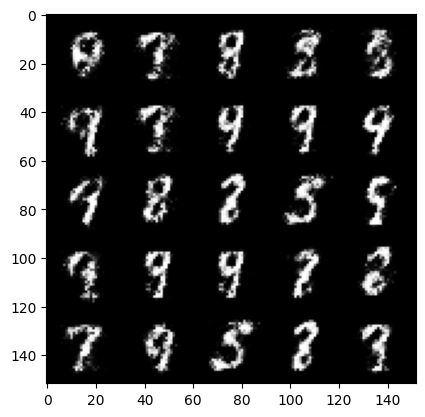

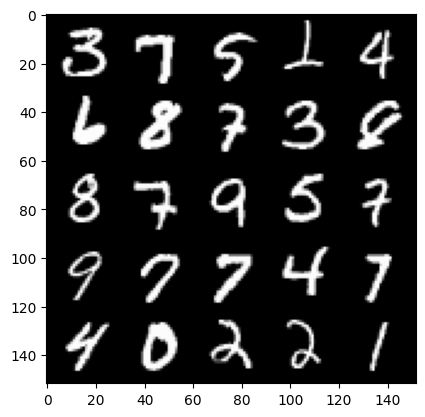

 70%|███████   | 330/469 [00:11<00:04, 30.41it/s]

Step 20500: Generator loss: 3.2899868259429903, discriminator loss: 0.28730207610130315


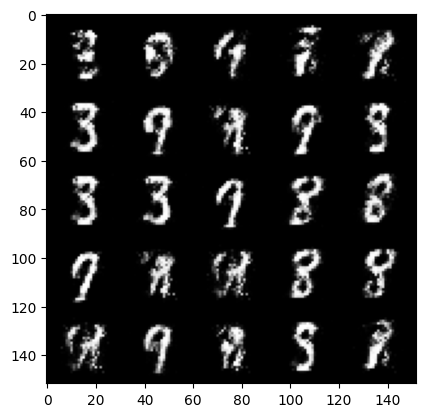

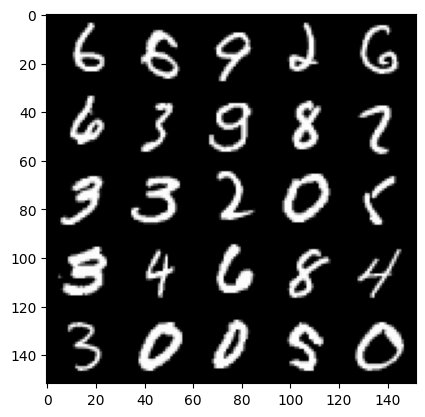

 77%|███████▋  | 363/469 [00:12<00:03, 30.49it/s]

Step 21000: Generator loss: 3.1656783041954046, discriminator loss: 0.31091286709904625


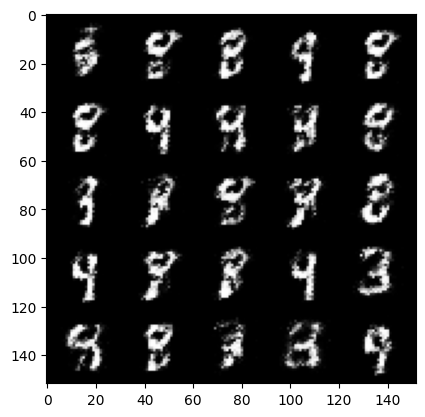

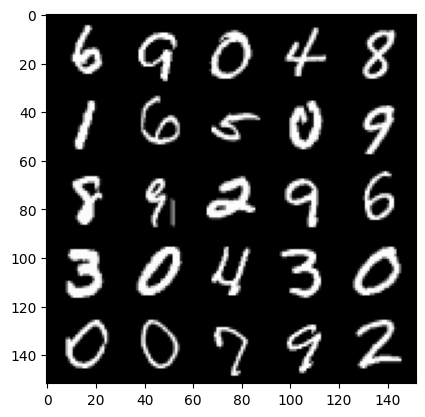

 84%|████████▍ | 395/469 [00:12<00:02, 32.09it/s]

Step 21500: Generator loss: 3.1636568083763135, discriminator loss: 0.30118599984049804


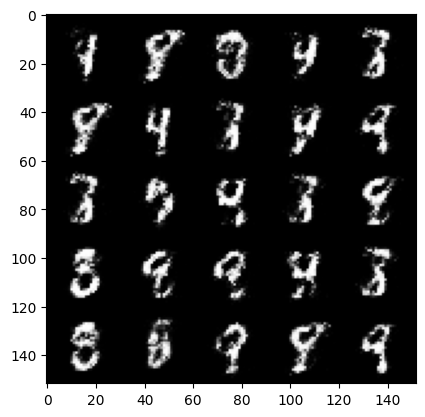

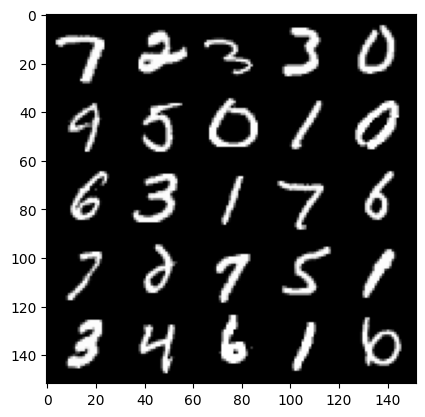

 91%|█████████ | 425/469 [00:14<00:01, 32.03it/s]

Step 22000: Generator loss: 3.251084692955018, discriminator loss: 0.2863898740410802


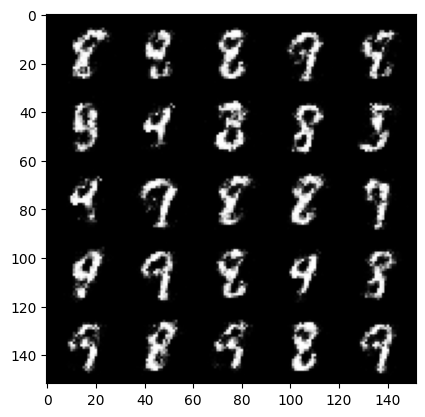

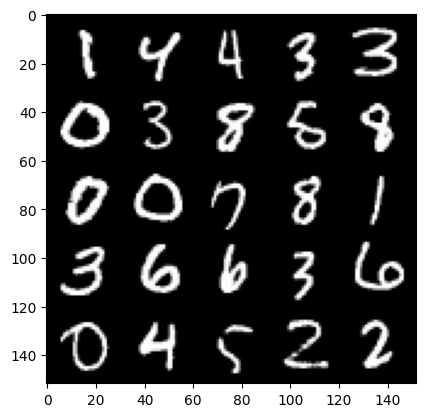

 97%|█████████▋| 454/469 [00:14<00:00, 31.10it/s]

Step 22500: Generator loss: 2.9784213523864733, discriminator loss: 0.35760559141635856


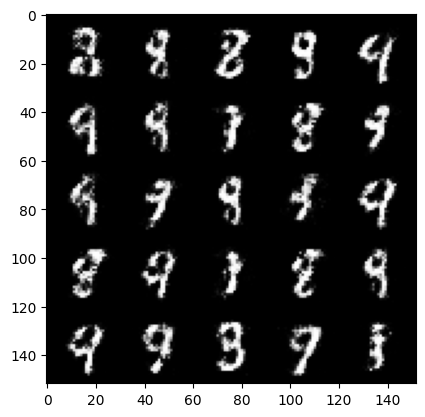

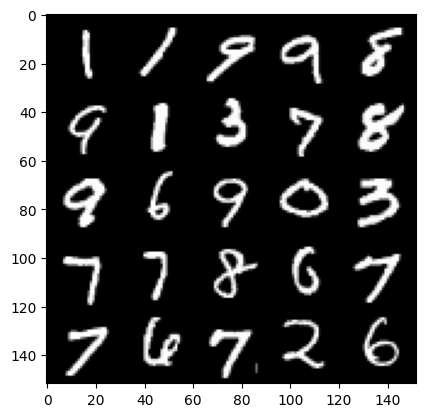

  3%|▎         | 16/469 [00:00<00:15, 28.76it/s]

Step 23000: Generator loss: 2.972978629589082, discriminator loss: 0.35850849249959016


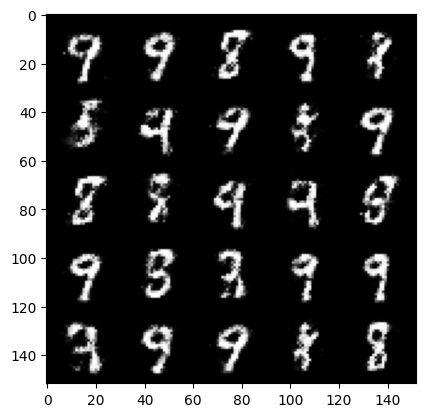

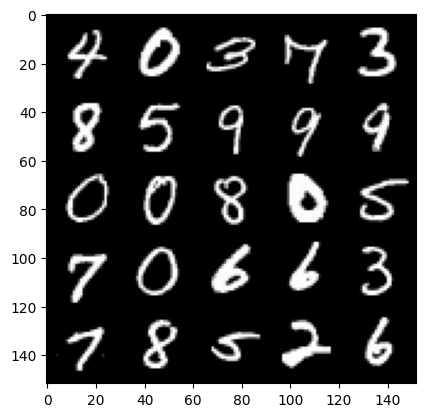

 10%|█         | 48/469 [00:01<00:13, 32.05it/s]

Step 23500: Generator loss: 3.0478439602851846, discriminator loss: 0.33209155976772314


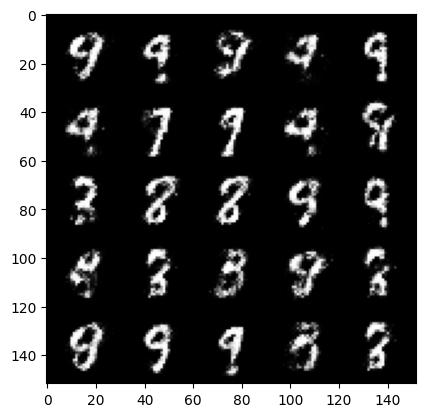

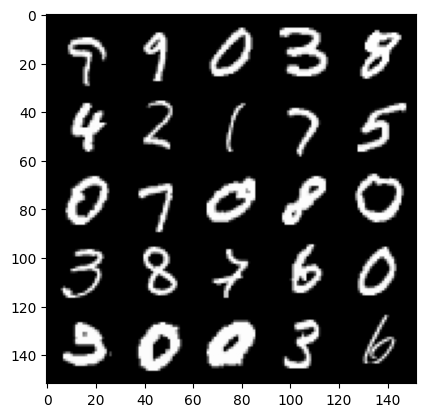

 17%|█▋        | 80/469 [00:02<00:12, 32.40it/s]

Step 24000: Generator loss: 2.926616855621337, discriminator loss: 0.36966551607847215


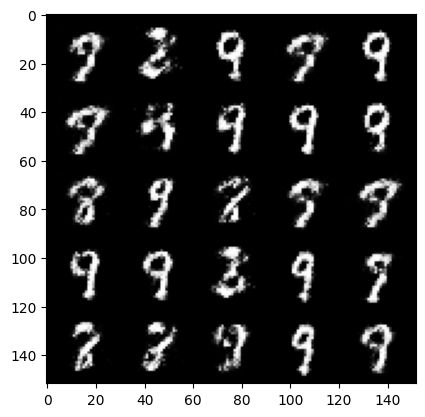

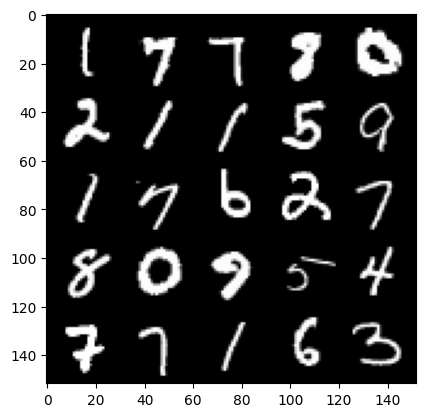

 24%|██▎       | 111/469 [00:03<00:11, 30.63it/s]

Step 24500: Generator loss: 2.840140610218046, discriminator loss: 0.3908492087721823


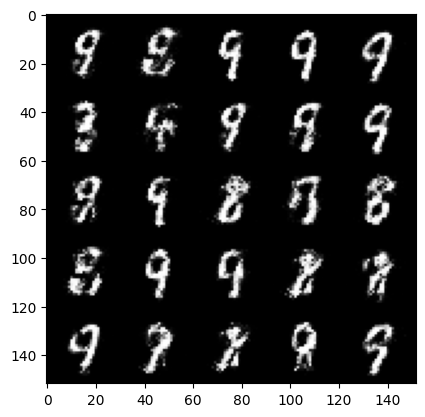

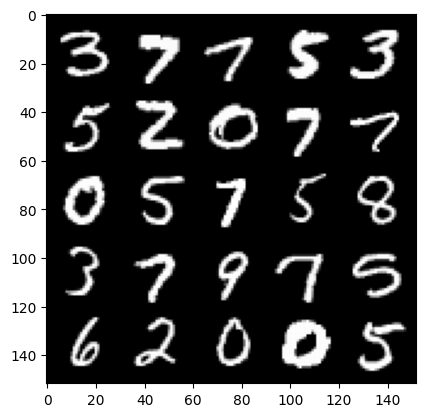

 30%|███       | 143/469 [00:04<00:10, 31.60it/s]

Step 25000: Generator loss: 2.872542305469512, discriminator loss: 0.3692362829446793


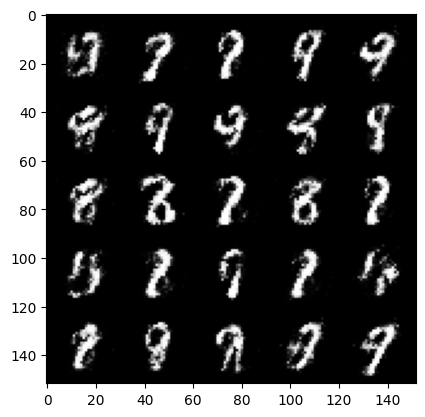

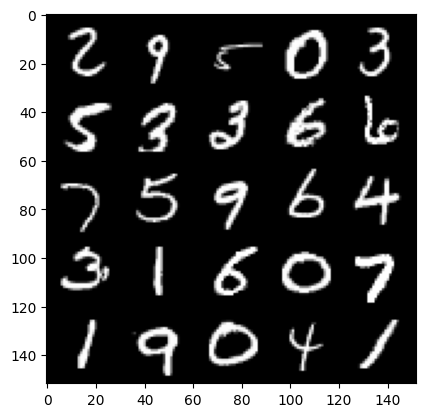

 37%|███▋      | 172/469 [00:04<00:08, 34.65it/s]

Step 25500: Generator loss: 3.125043657779692, discriminator loss: 0.31692548644542706


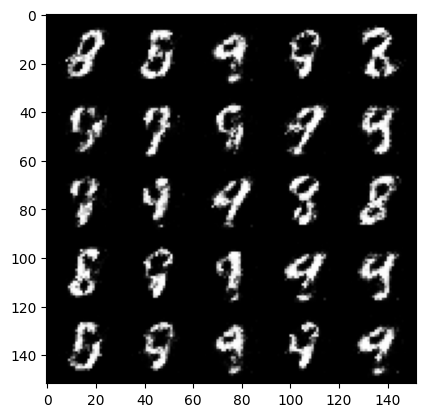

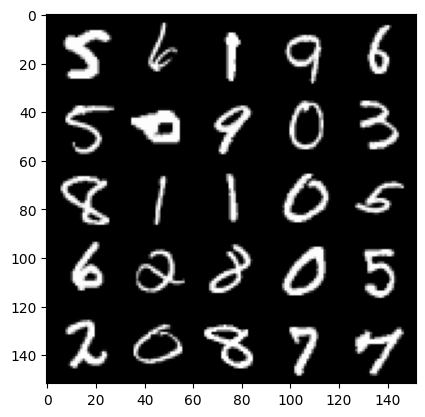

 43%|████▎     | 204/469 [00:06<00:07, 33.57it/s]

Step 26000: Generator loss: 2.9621238374710104, discriminator loss: 0.3626904123127455


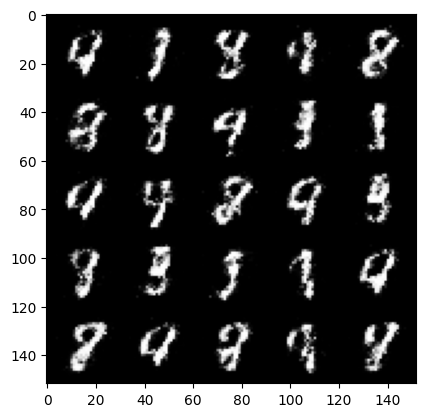

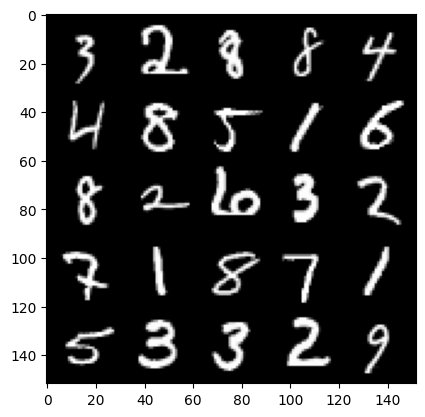

 50%|█████     | 236/469 [00:07<00:07, 31.54it/s]

Step 26500: Generator loss: 2.859346372604371, discriminator loss: 0.3709674357175825


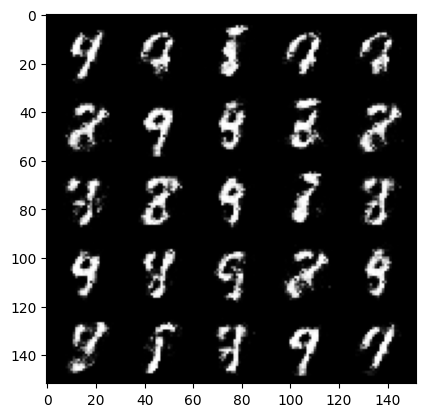

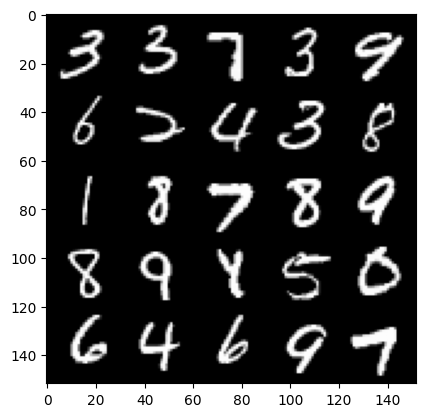

 57%|█████▋    | 266/469 [00:08<00:05, 34.47it/s]

Step 27000: Generator loss: 2.8636068272590642, discriminator loss: 0.40787239128351194


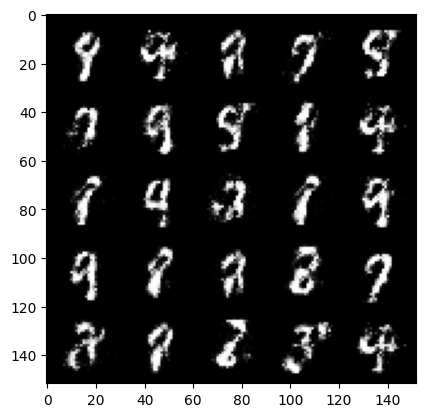

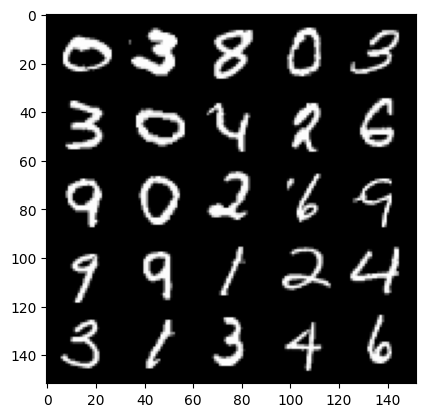

 63%|██████▎   | 295/469 [00:08<00:04, 36.72it/s]

Step 27500: Generator loss: 2.8356097860336313, discriminator loss: 0.3942406321167946


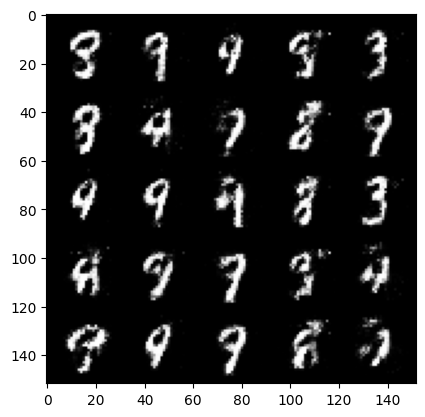

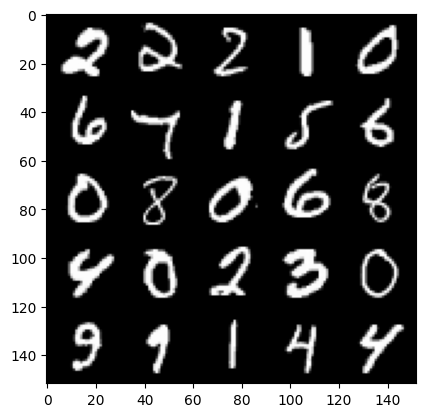

 70%|██████▉   | 328/469 [00:09<00:04, 34.36it/s]

Step 28000: Generator loss: 2.6548214645385766, discriminator loss: 0.42285740271210687


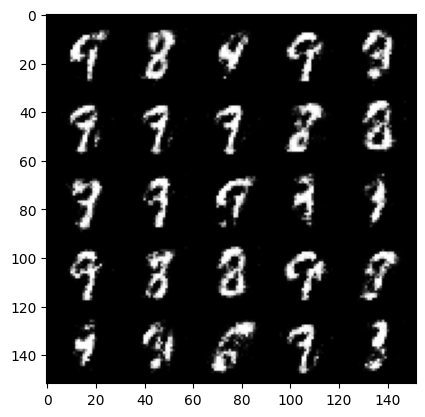

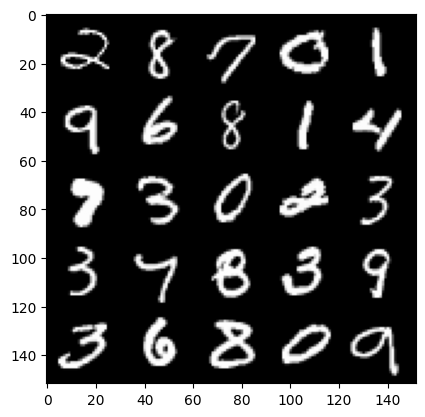

 77%|███████▋  | 360/469 [00:09<00:02, 37.69it/s]

Step 28500: Generator loss: 2.6978193750381494, discriminator loss: 0.42261427158117304


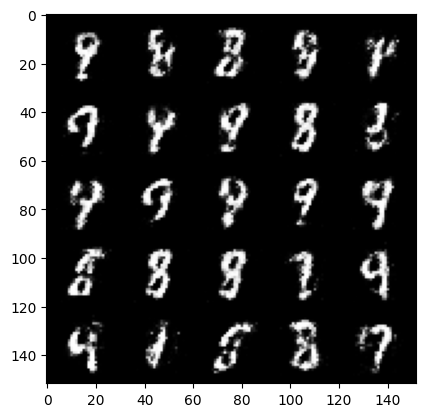

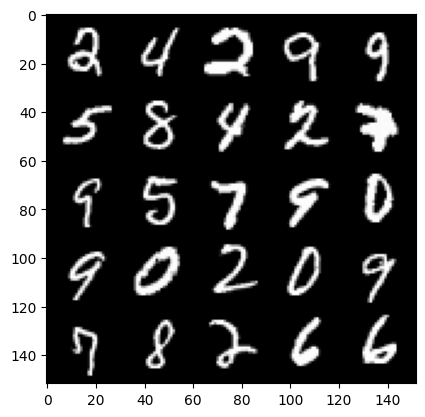

 83%|████████▎ | 389/469 [00:11<00:02, 34.33it/s]

Step 29000: Generator loss: 2.7175109724998494, discriminator loss: 0.4064685845077038


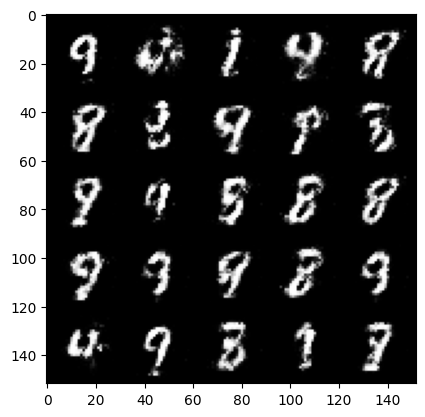

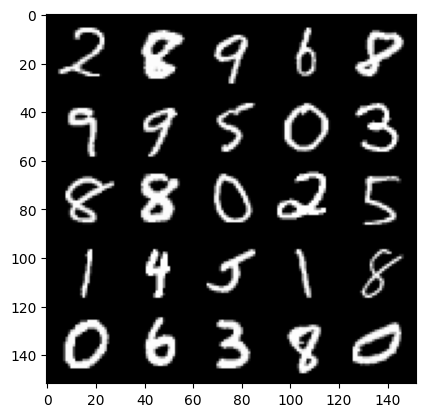

 90%|████████▉ | 421/469 [00:13<00:01, 31.31it/s]

Step 29500: Generator loss: 2.7967465977668793, discriminator loss: 0.3771698511242865


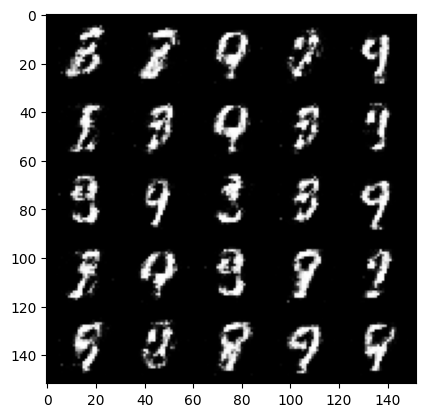

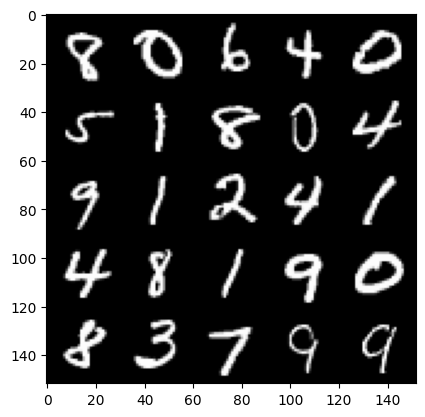

 96%|█████████▋| 452/469 [00:13<00:00, 27.86it/s]

Step 30000: Generator loss: 2.708518688678738, discriminator loss: 0.4141845525503163


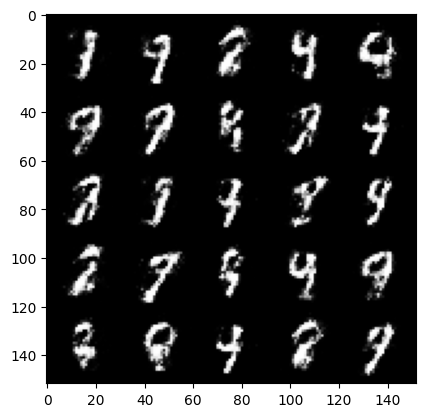

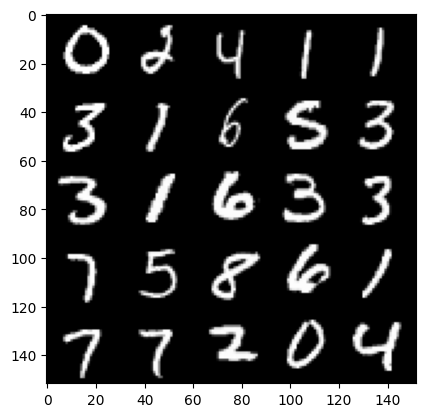

  3%|▎         | 12/469 [00:00<00:14, 32.07it/s]

Step 30500: Generator loss: 2.5530902638435347, discriminator loss: 0.4162781483232974


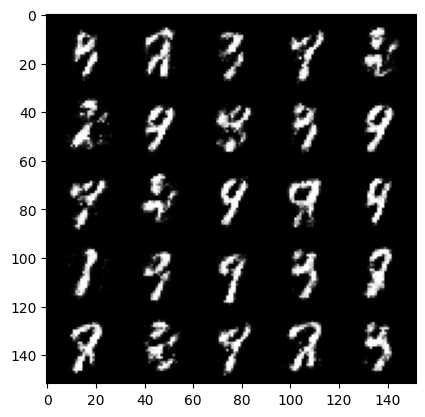

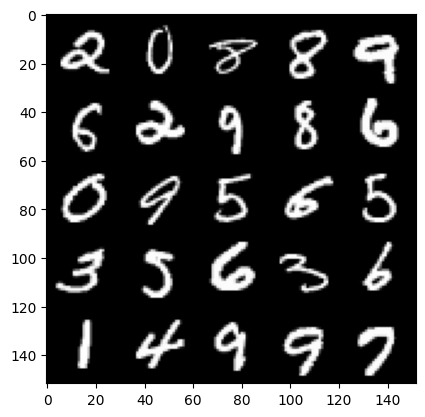

  9%|▉         | 44/469 [00:01<00:12, 33.75it/s]

Step 31000: Generator loss: 2.6729153409004183, discriminator loss: 0.4083000475466249


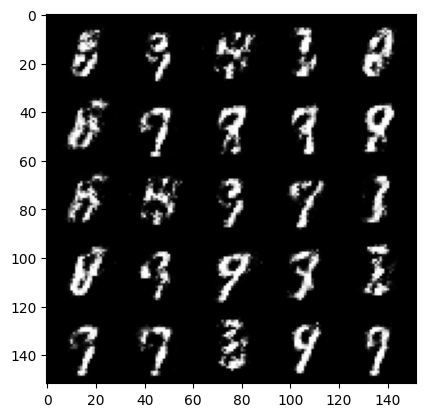

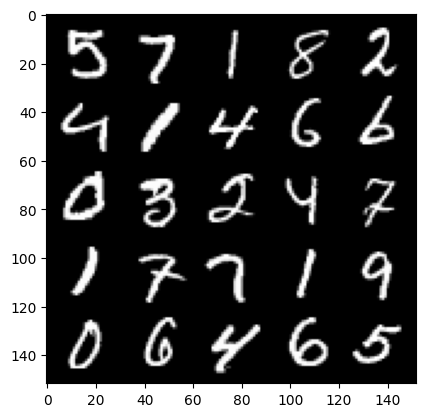

 16%|█▌        | 76/469 [00:02<00:11, 34.58it/s]

Step 31500: Generator loss: 2.570265187263489, discriminator loss: 0.45795999464392717


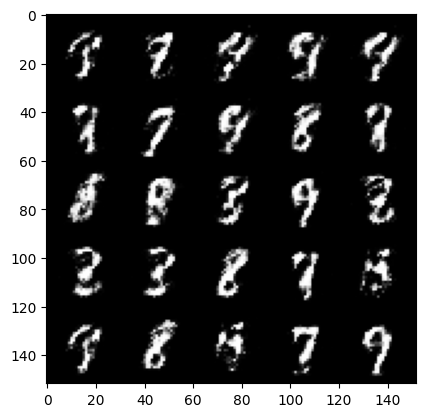

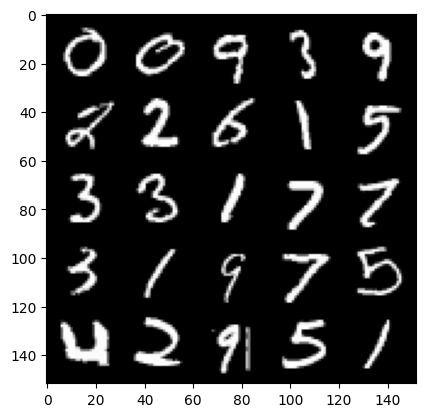

 23%|██▎       | 108/469 [00:03<00:09, 37.07it/s]

Step 32000: Generator loss: 2.509150677204135, discriminator loss: 0.46417115747928644


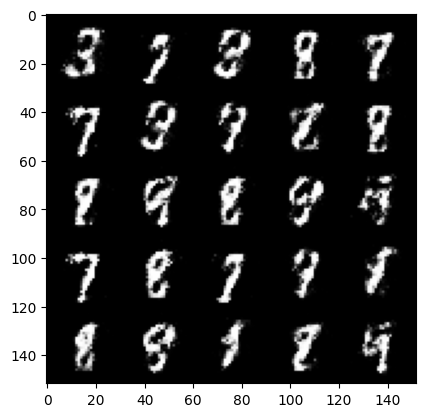

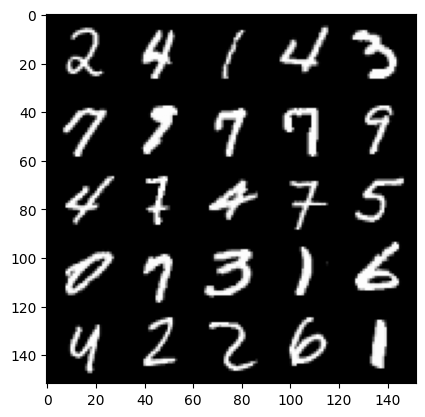

 29%|██▉       | 136/469 [00:03<00:09, 36.47it/s]

Step 32500: Generator loss: 2.642401334762573, discriminator loss: 0.4128059850633148


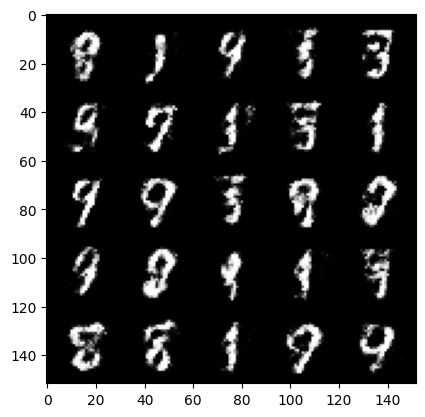

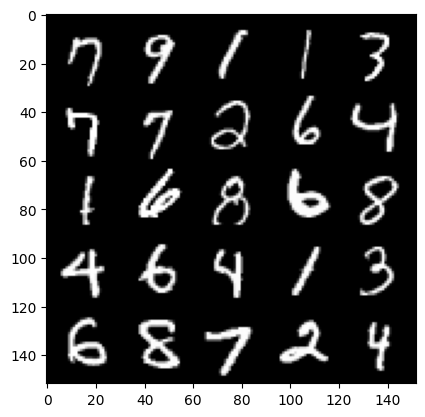

 36%|███▌      | 168/469 [00:04<00:08, 34.83it/s]

Step 33000: Generator loss: 2.4167321097850794, discriminator loss: 0.48677221351861905


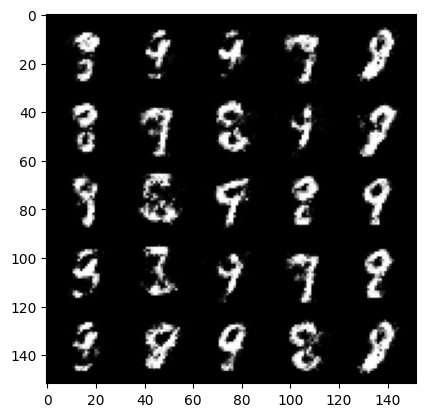

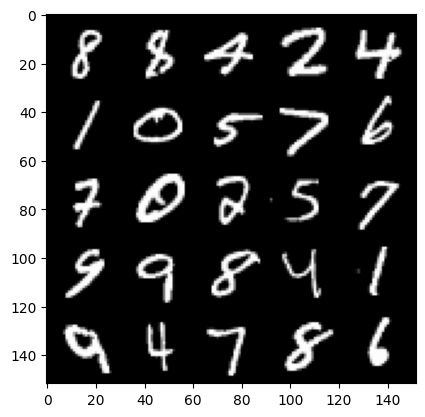

 43%|████▎     | 201/469 [00:05<00:07, 35.52it/s]

Step 33500: Generator loss: 2.650545305728913, discriminator loss: 0.4207439722716806


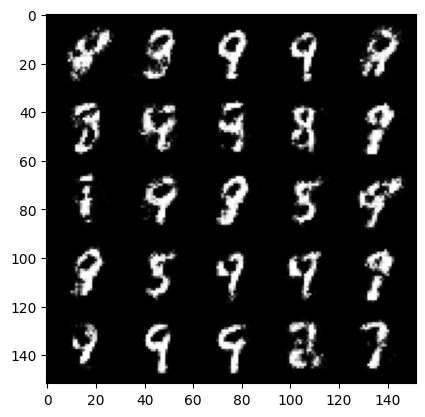

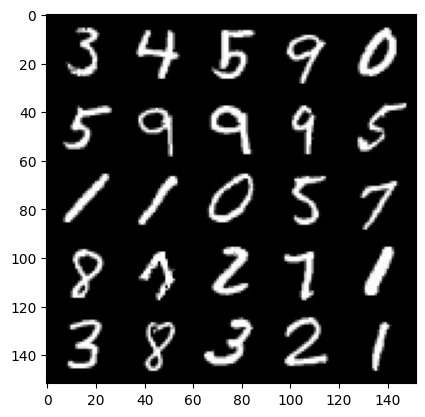

 49%|████▉     | 231/469 [00:06<00:06, 35.26it/s]

Step 34000: Generator loss: 2.5604624328613257, discriminator loss: 0.45411928957700726


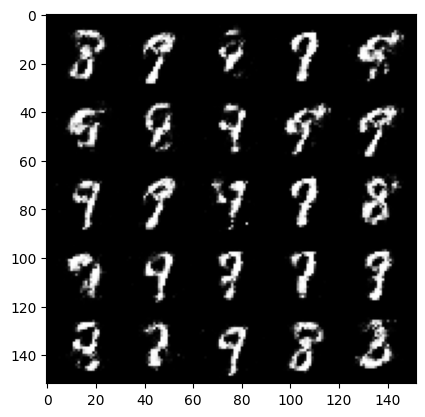

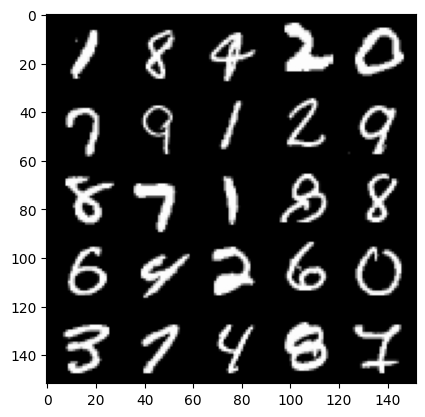

 56%|█████▌    | 263/469 [00:08<00:06, 32.14it/s]

Step 34500: Generator loss: 2.4952722973823556, discriminator loss: 0.46884413534402897


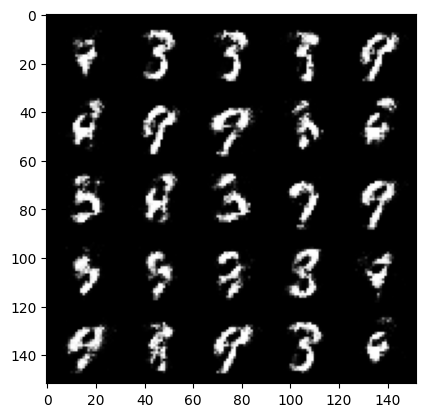

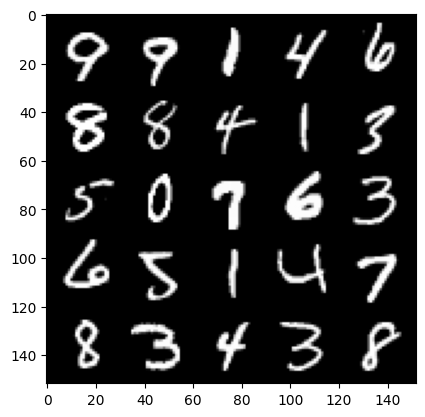

 62%|██████▏   | 292/469 [16:47<00:05, 31.63it/s]  

Step 35000: Generator loss: 2.6690634107589726, discriminator loss: 0.40823232430219625


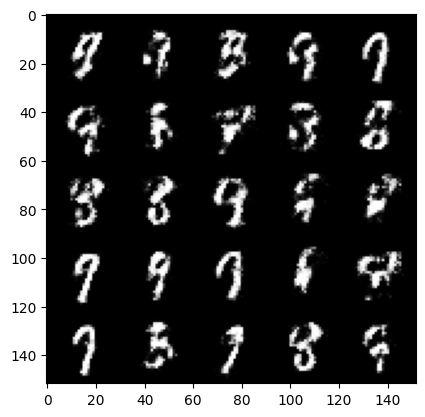

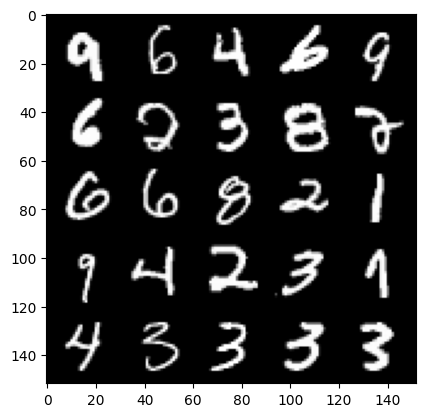

 69%|██████▉   | 325/469 [00:06<00:02, 54.35it/s]

Step 35500: Generator loss: 2.4972899823188794, discriminator loss: 0.4675577753782273


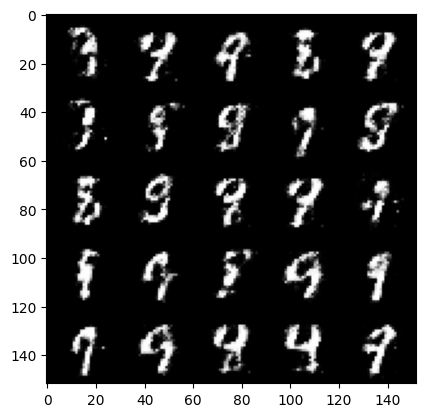

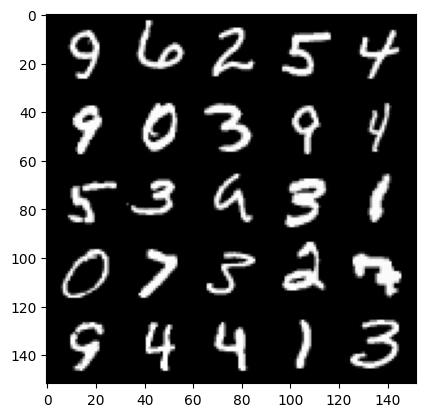

 75%|███████▌  | 353/469 [00:06<00:02, 53.83it/s]

Step 36000: Generator loss: 2.4051232297420504, discriminator loss: 0.4920488552451138


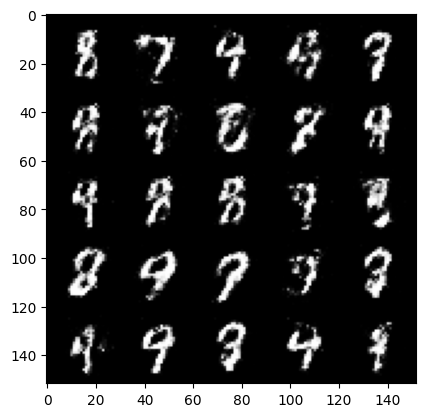

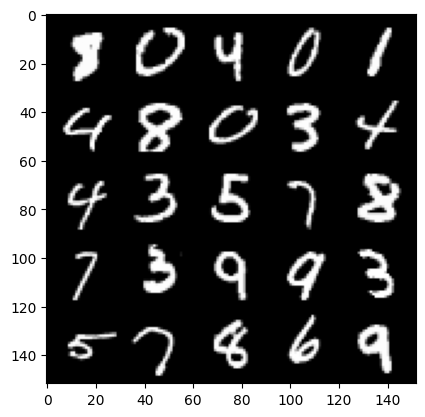

 82%|████████▏ | 384/469 [00:07<00:01, 54.94it/s]

Step 36500: Generator loss: 2.395600741624833, discriminator loss: 0.5032526378035544


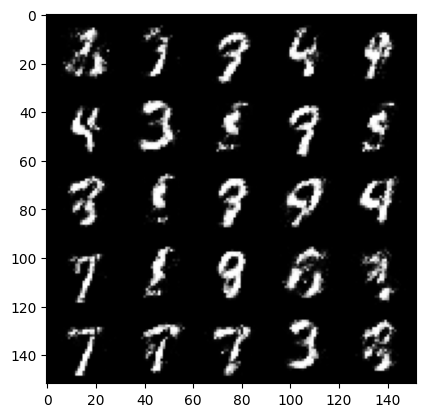

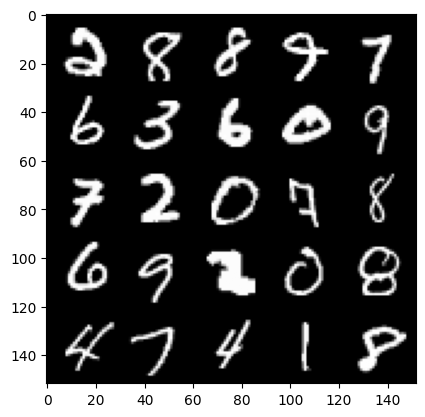

 88%|████████▊ | 413/469 [00:07<00:01, 41.85it/s]

Step 37000: Generator loss: 2.3710383183956134, discriminator loss: 0.5279217741489407


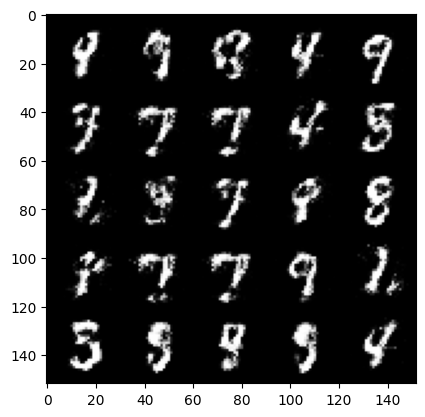

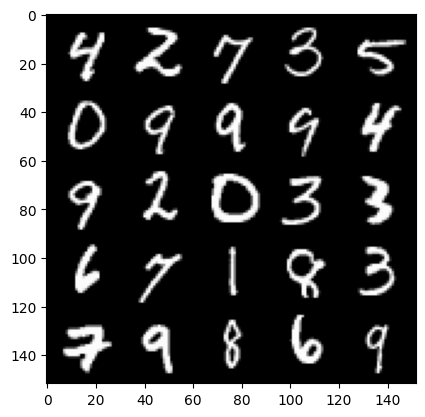

 95%|█████████▌| 447/469 [00:07<00:00, 58.75it/s]

Step 37500: Generator loss: 2.371372828006745, discriminator loss: 0.528841315746307


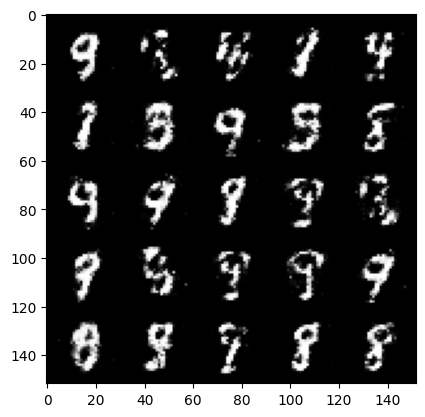

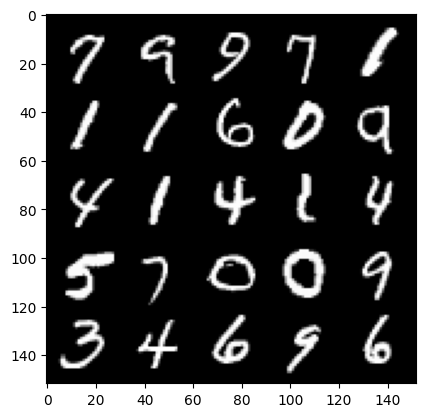

  2%|▏         | 11/469 [00:00<00:09, 50.40it/s]

Step 38000: Generator loss: 2.3677685291767117, discriminator loss: 0.553175367474556


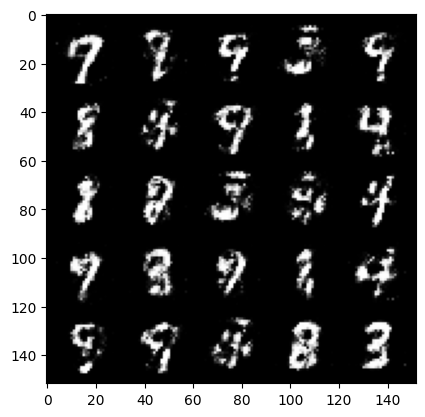

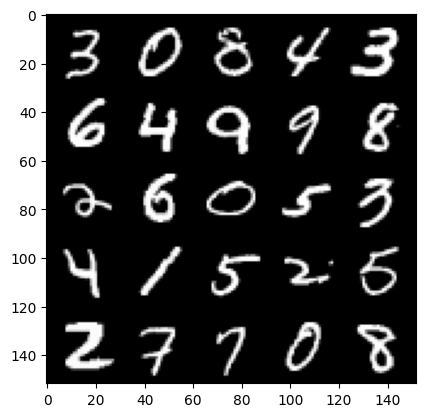

  9%|▉         | 42/469 [00:00<00:08, 51.70it/s]

Step 38500: Generator loss: 2.1858736941814403, discriminator loss: 0.5857265277504918


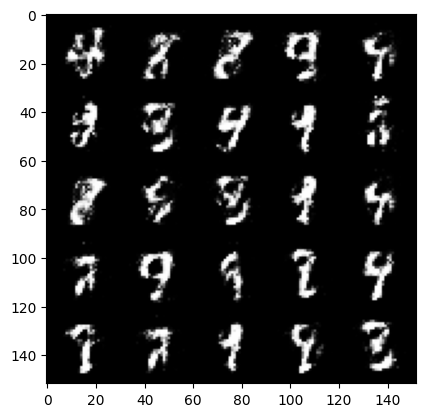

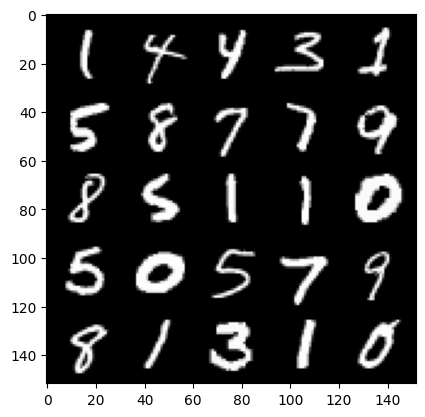

 15%|█▍        | 70/469 [00:01<00:07, 50.13it/s]

Step 39000: Generator loss: 2.2154628994464876, discriminator loss: 0.5973111209273336


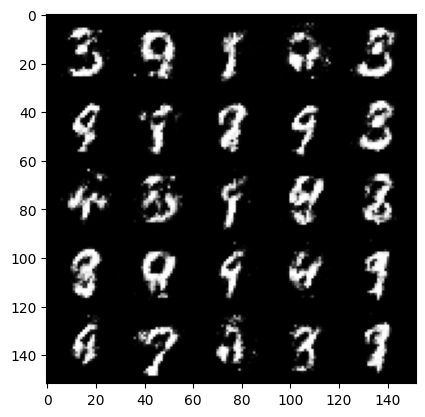

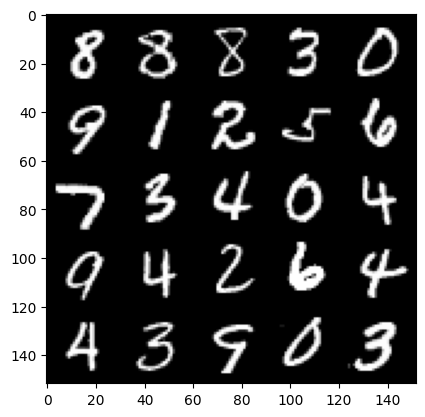

 22%|██▏       | 101/469 [00:01<00:07, 49.83it/s]

Step 39500: Generator loss: 2.256952654123309, discriminator loss: 0.5441373453140261


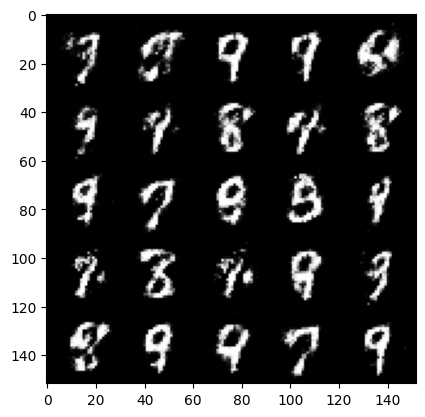

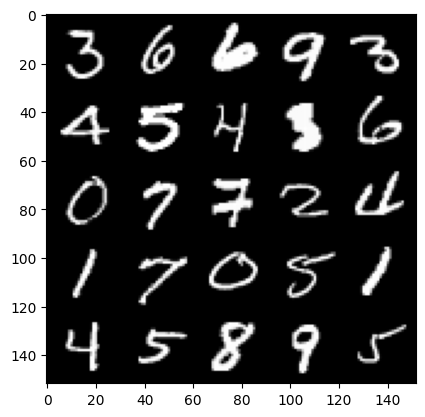

 29%|██▉       | 135/469 [00:02<00:06, 48.74it/s]

Step 40000: Generator loss: 2.199048205852509, discriminator loss: 0.5678362774848937


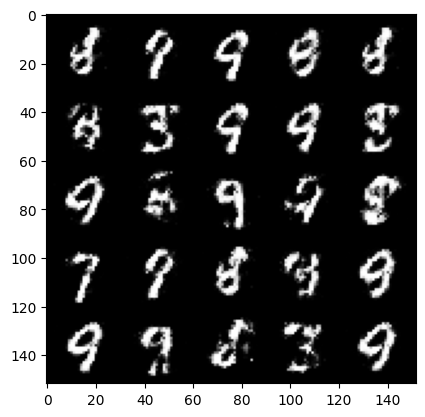

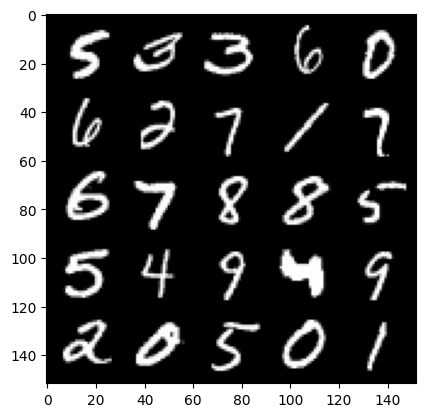

 35%|███▌      | 166/469 [00:03<00:06, 50.22it/s]

Step 40500: Generator loss: 2.3045231580734282, discriminator loss: 0.5369656659364697


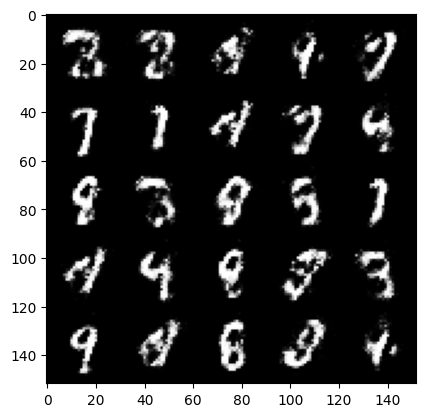

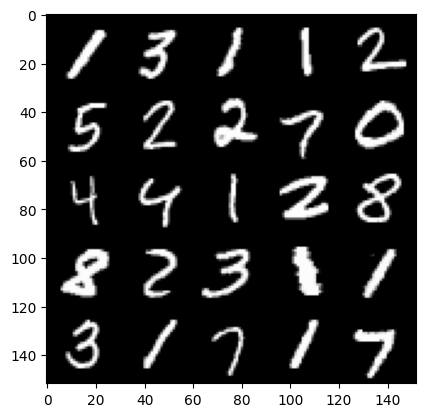

 42%|████▏     | 195/469 [00:04<00:05, 45.89it/s]

Step 41000: Generator loss: 2.256816137552262, discriminator loss: 0.5278457839488984


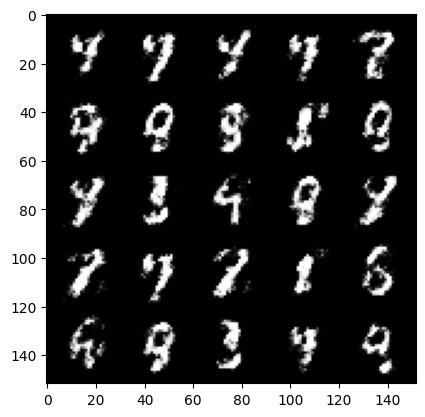

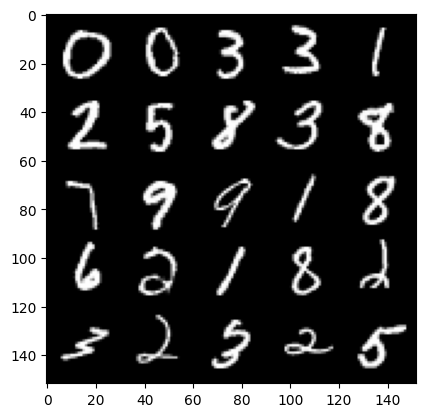

 49%|████▊     | 228/469 [00:04<00:08, 28.14it/s]

Step 41500: Generator loss: 2.297911206722257, discriminator loss: 0.55223730134964


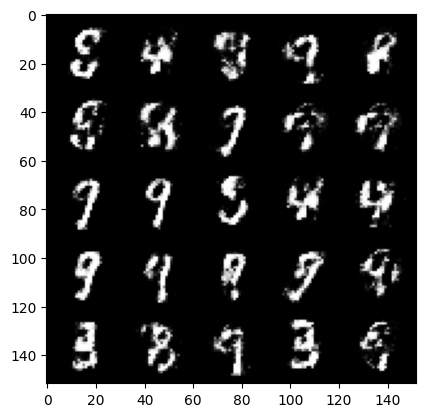

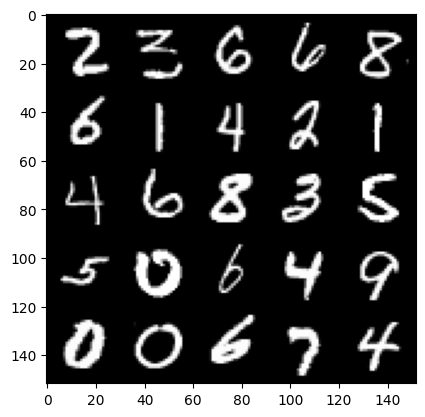

 55%|█████▌    | 259/469 [00:05<00:04, 48.51it/s]

Step 42000: Generator loss: 2.335350879192353, discriminator loss: 0.5113973051309577


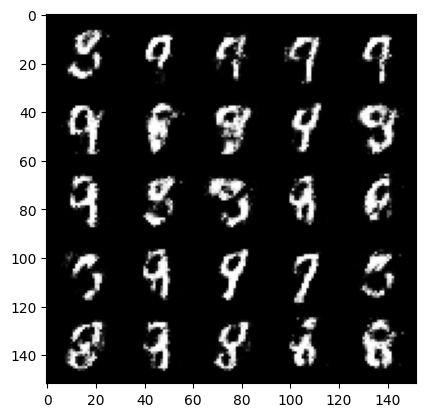

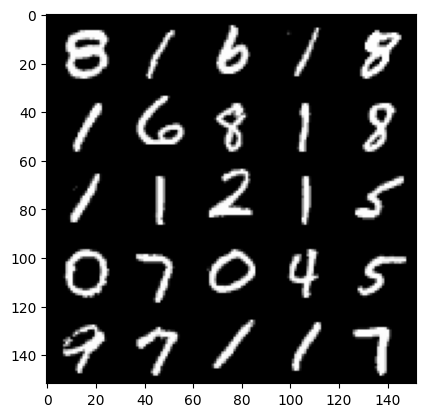

 61%|██████    | 286/469 [00:42<00:04, 42.10it/s]

Step 42500: Generator loss: 2.2521481881141674, discriminator loss: 0.5524851485490804


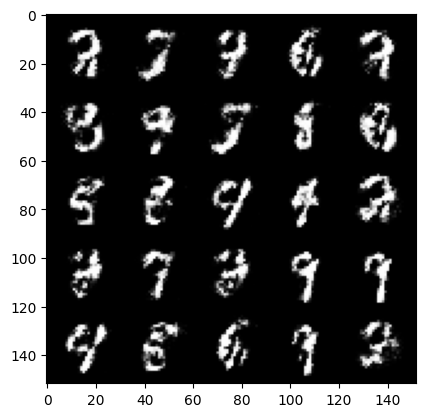

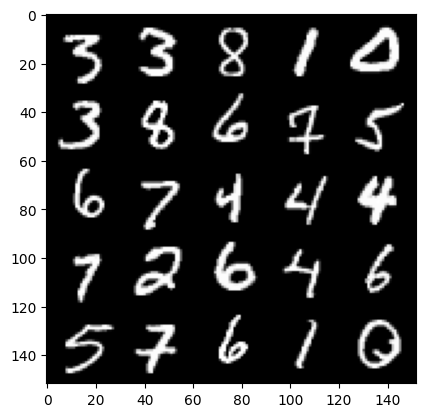

 68%|██████▊   | 321/469 [00:06<00:02, 52.55it/s]

Step 43000: Generator loss: 2.337336710214617, discriminator loss: 0.5249847421646117


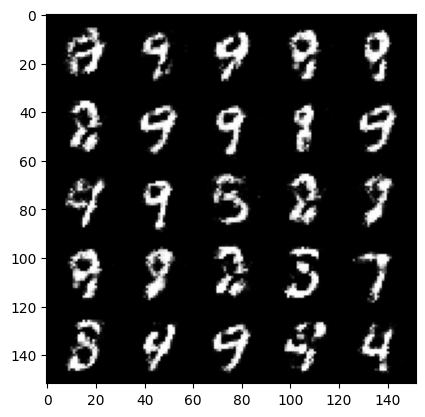

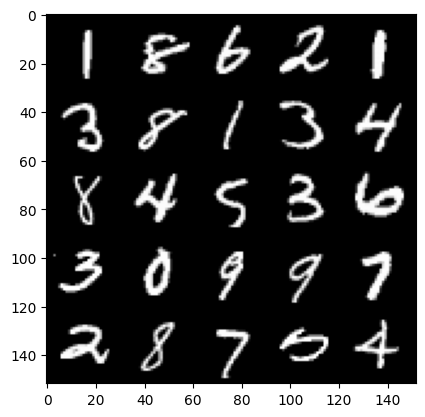

 74%|███████▍  | 349/469 [00:06<00:02, 54.05it/s]

Step 43500: Generator loss: 2.124928906202317, discriminator loss: 0.5963065425157545


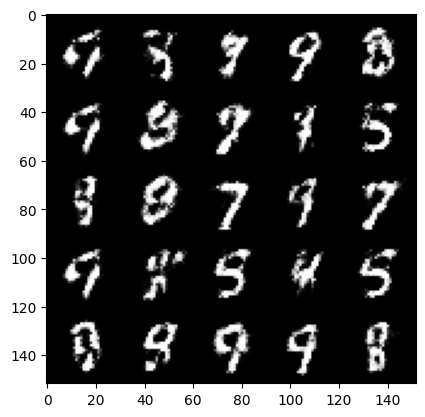

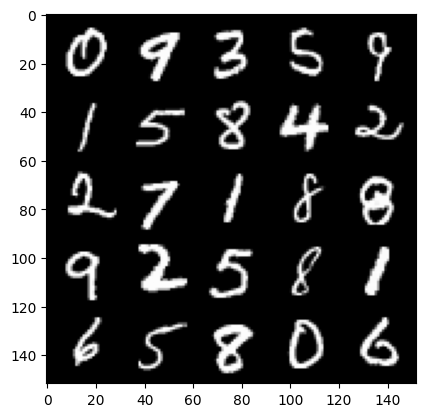

 81%|████████  | 379/469 [00:06<00:01, 59.64it/s]

Step 44000: Generator loss: 2.178454567670823, discriminator loss: 0.5298015804290773


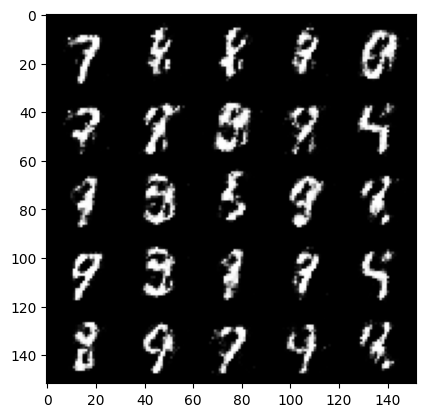

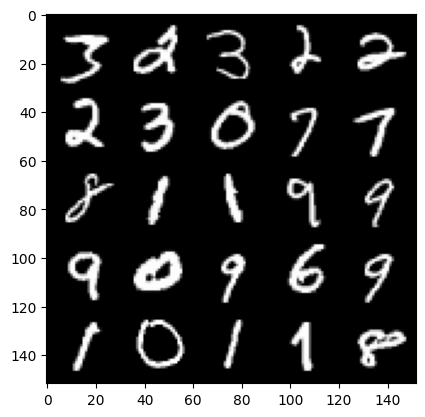

 87%|████████▋ | 408/469 [00:07<00:01, 56.90it/s]

Step 44500: Generator loss: 2.380567198991777, discriminator loss: 0.4724698624014857


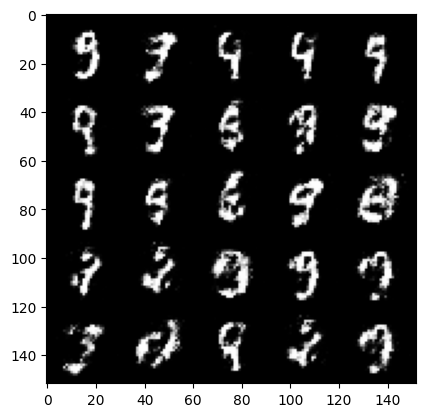

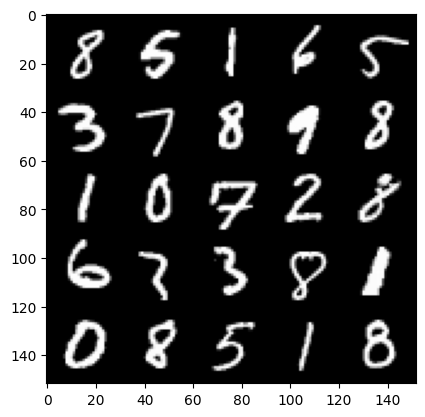

 94%|█████████▍| 441/469 [00:07<00:00, 60.85it/s]

Step 45000: Generator loss: 2.3055660836696616, discriminator loss: 0.5196701518297197


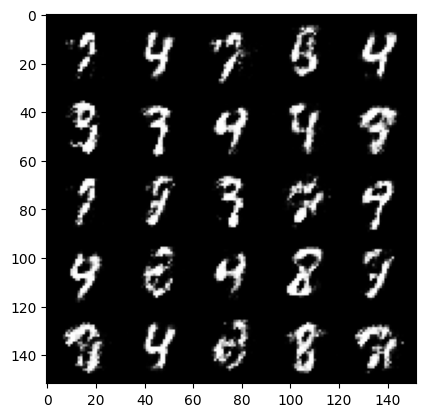

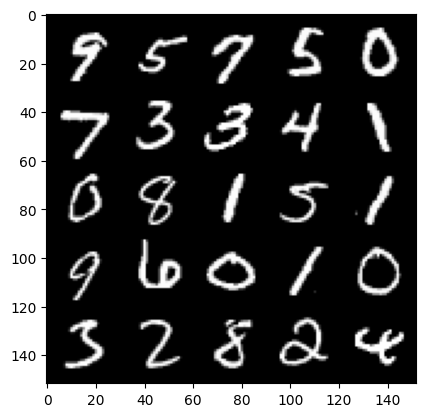

  1%|▏         | 7/469 [00:00<00:07, 60.88it/s]

Step 45500: Generator loss: 2.196842329502107, discriminator loss: 0.5392612146139145


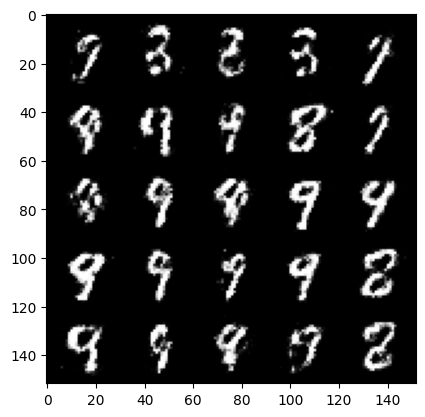

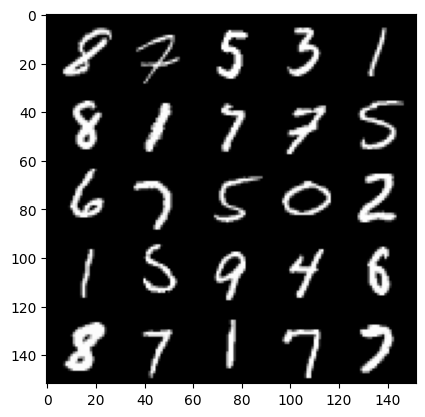

  7%|▋         | 35/469 [00:00<00:07, 56.73it/s]

Step 46000: Generator loss: 2.1914450762271884, discriminator loss: 0.5476045033335682


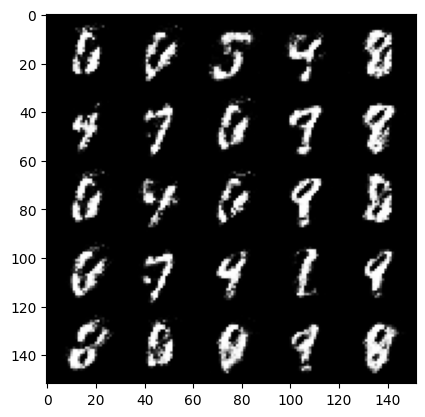

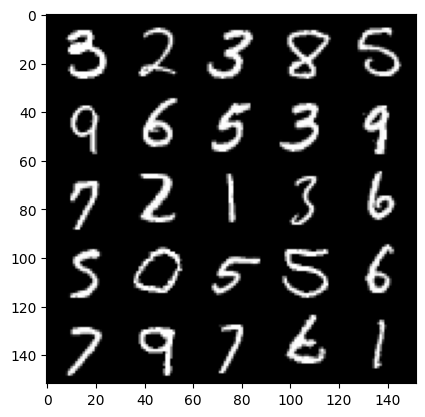

 13%|█▎        | 63/469 [00:01<00:06, 60.99it/s]

Step 46500: Generator loss: 2.253170133829116, discriminator loss: 0.5421839544177056


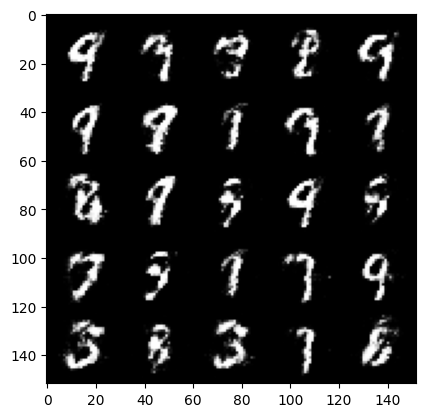

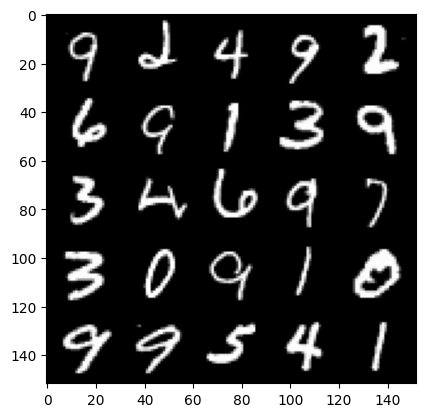

 21%|██        | 97/469 [00:01<00:06, 60.68it/s]

Step 47000: Generator loss: 2.126934138298034, discriminator loss: 0.5888313767910005


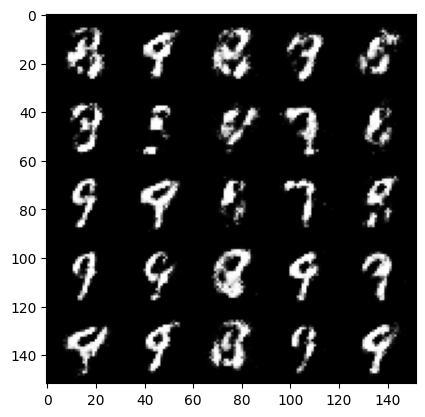

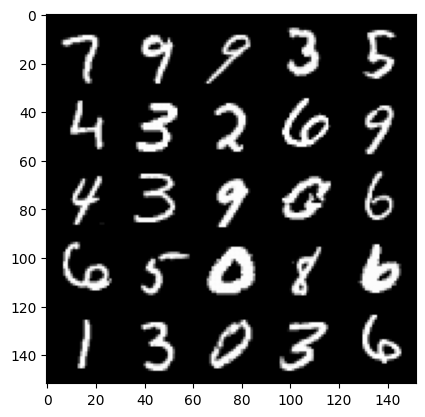

 27%|██▋       | 126/469 [00:02<00:06, 53.35it/s]

Step 47500: Generator loss: 2.1694386301040653, discriminator loss: 0.5826563526391987


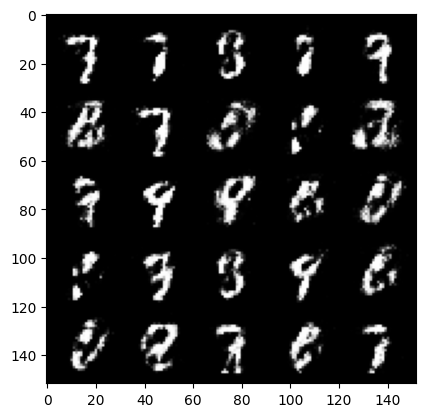

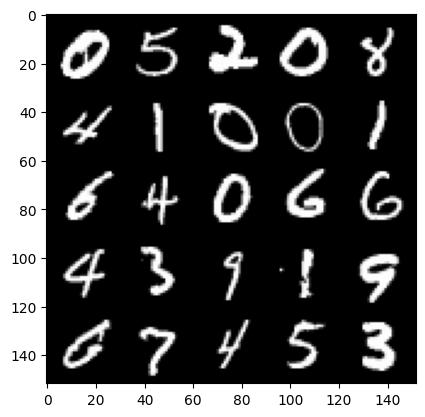

 35%|███▍      | 162/469 [00:03<00:06, 49.85it/s]

Step 48000: Generator loss: 2.033034983396528, discriminator loss: 0.6201435914039615


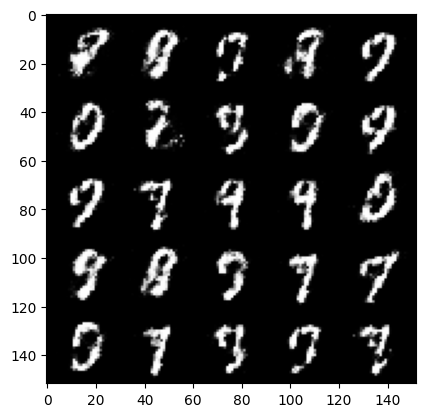

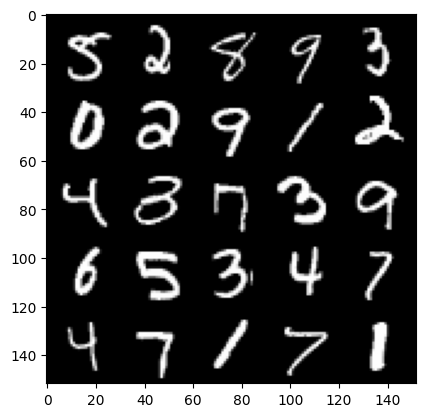

 40%|████      | 189/469 [00:04<00:06, 41.51it/s]

Step 48500: Generator loss: 2.103104024410248, discriminator loss: 0.6041987171769139


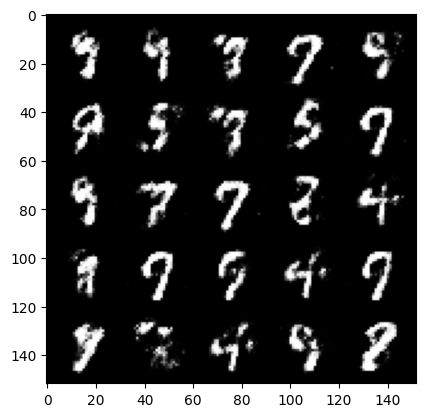

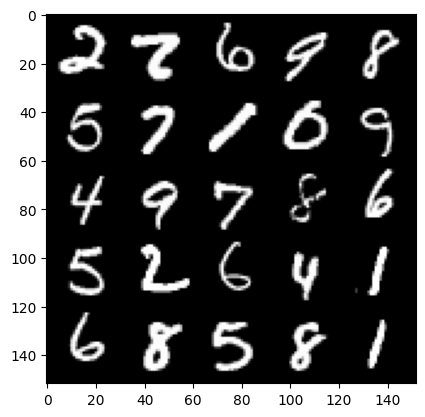

 47%|████▋     | 220/469 [00:04<00:04, 51.43it/s]

Step 49000: Generator loss: 1.973886434555054, discriminator loss: 0.6220854440331456


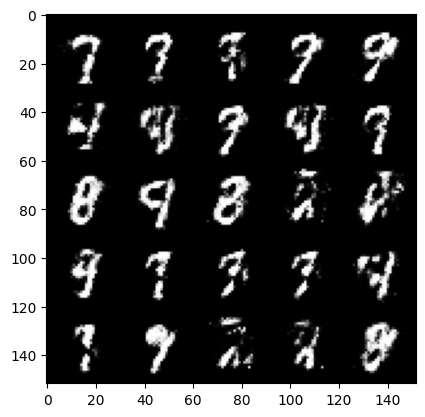

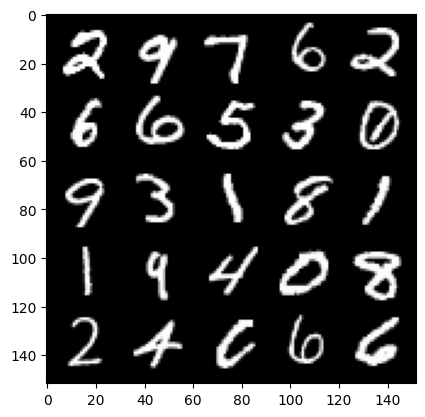

 54%|█████▍    | 253/469 [00:05<00:04, 51.03it/s]

Step 49500: Generator loss: 2.1414928209781645, discriminator loss: 0.5635019276142124


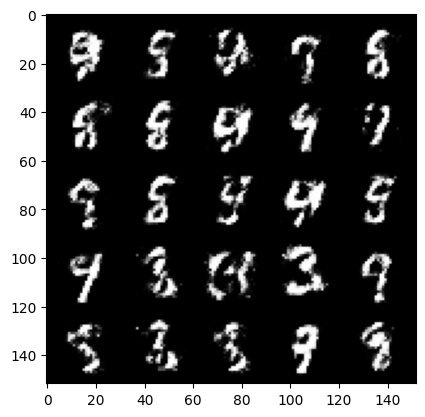

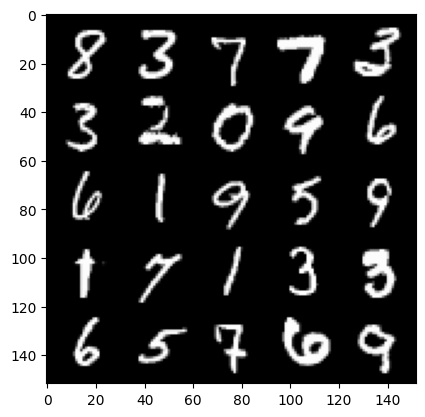

 60%|█████▉    | 281/469 [00:04<00:03, 50.47it/s]

Step 50000: Generator loss: 2.049332350492476, discriminator loss: 0.5949505947828295


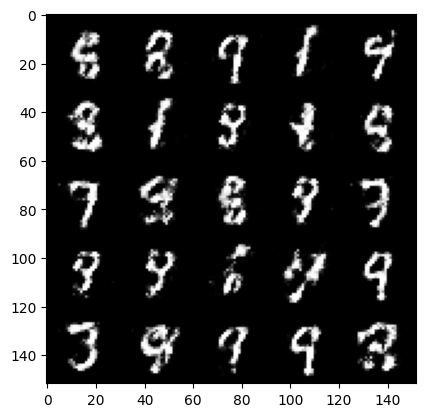

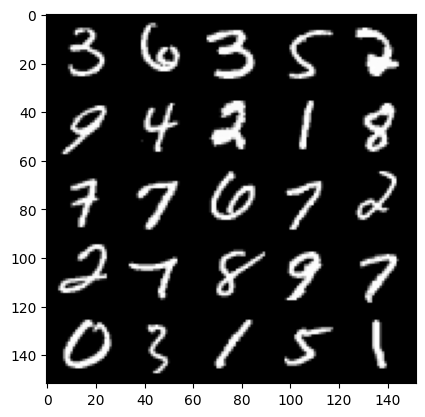

 67%|██████▋   | 315/469 [00:05<00:02, 58.79it/s]

Step 50500: Generator loss: 2.087450911283494, discriminator loss: 0.5648663268089297


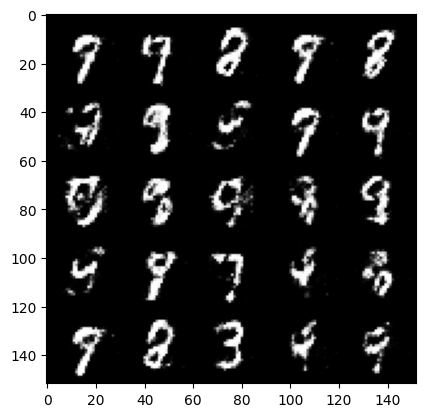

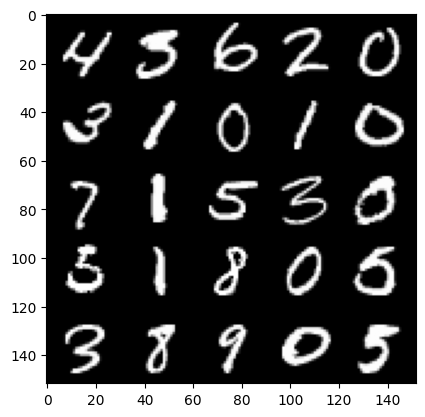

 73%|███████▎  | 344/469 [00:05<00:02, 58.18it/s]

Step 51000: Generator loss: 2.0276146907806387, discriminator loss: 0.6226950158476832


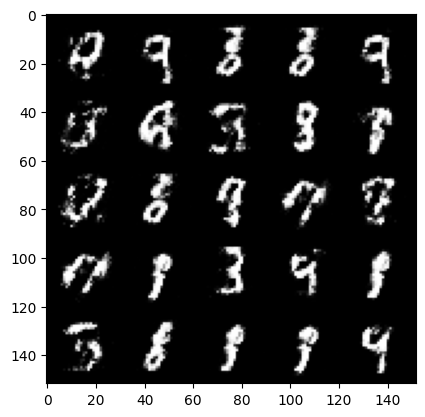

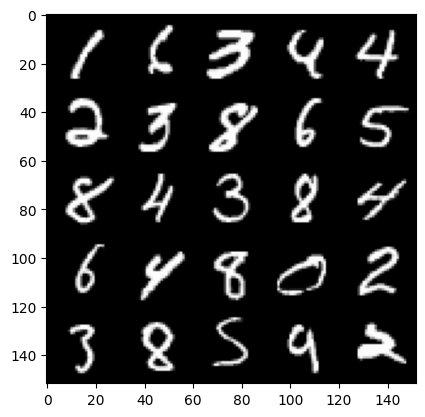

 81%|████████  | 378/469 [03:52<00:02, 35.27it/s]

Step 51500: Generator loss: 2.023440142393112, discriminator loss: 0.6073292617201805


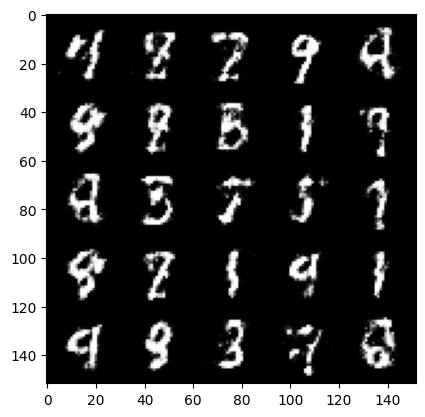

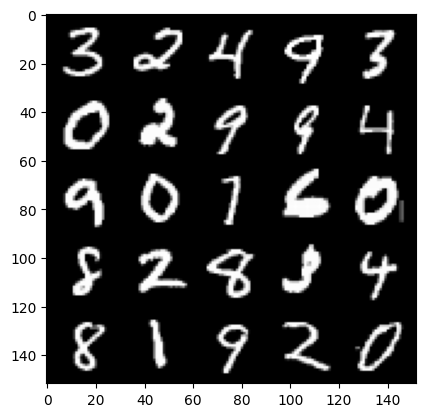

 87%|████████▋ | 408/469 [00:10<00:01, 57.40it/s]

Step 52000: Generator loss: 2.011047313690185, discriminator loss: 0.6097155119180676


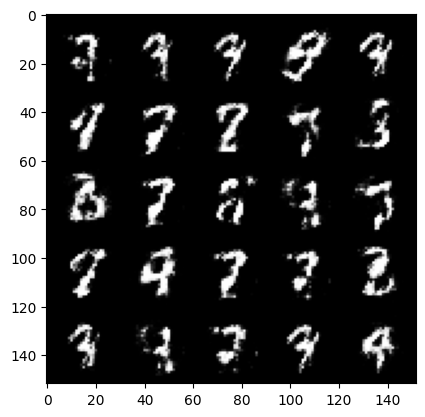

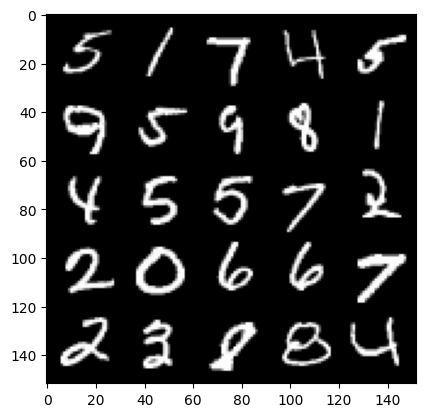

 93%|█████████▎| 438/469 [05:45<00:01, 24.54it/s]

Step 52500: Generator loss: 1.97813898873329, discriminator loss: 0.6097717279791834


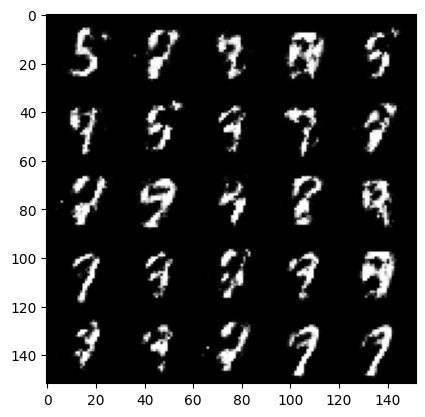

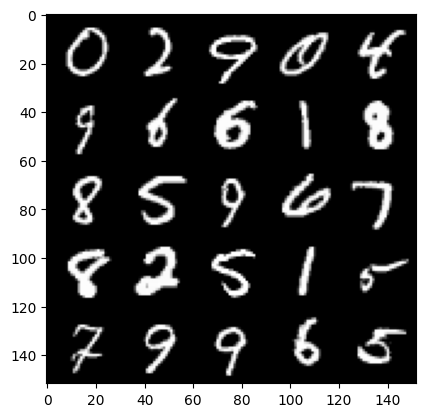

 64%|██████▍   | 300/469 [00:07<00:04, 38.82it/s]

In [21]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
criterion = nn.BCEWithLogitsLoss()


gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

for epoch in range(n_epochs):
    for real, _ in tqdm(dataloader):
        # image : 128, 1, 28, 28
        cur_batch_size = len(real)
        real_images = real.view(cur_batch_size, -1).to(device)
        # Train the discriminator 
        disc_opt.zero_grad()
        
        # Generate fake images and calculate fake loss of discriminator
        noise = torch.randn(n_samples, z_dim, device=device)
        fake_images = gen(noise)
        disc_fake_pred = disc(fake_images)

        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))

        # Use real images to calculate real loss of discriminator
        disc_real_pred = disc(real_images)
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))

        disc_loss = disc_real_loss + disc_fake_loss
        disc_loss.backward()
        disc_opt.step()


        # Train the generator
        gen_opt.zero_grad()
        noise = torch.randn(n_samples, z_dim, device=device)
        fake_images = gen(noise)
        desc_fake_pred = disc(fake_images)

        gen_loss = criterion(desc_fake_pred, torch.ones_like(desc_fake_pred))

        gen_loss.backward()
        gen_opt.step()
 

        mean_discriminator_loss += disc_loss.item() / display_step

        mean_generator_loss += gen_loss.item() / display_step

        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = torch.randn(n_samples, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real_images)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
